In [ ]:
from collections import OrderedDict
from pathlib import Path
import re
import sys
import warnings

import cartopy.crs as ccrs
import geopandas as gpd
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage

# Create output directories
from scipy.ndimage import median_filter
from scipy.signal import savgol_filter
import seaborn as sns
from sklearn.decomposition import PCA

# Compute silhouette scores
from sklearn.metrics import (
    calinski_harabasz_score,
    davies_bouldin_score,
    silhouette_samples,
    silhouette_score,
)
import xarray as xr

sys.path.append("../")

from src.analytics.static_analysis import (
    get_cluster_colors,
    get_cluster_markers,
    get_marker_size_corrections,
    get_size_categories,
    interpret_cluster_from_data,
)
from src.plots.maps import russia_plots
from src.readers.geom_reader import load_geodata
from src.utils.logger import setup_logger

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
log = setup_logger("chapter_one", log_file="../logs/chapter_one.log")

ws, gauges = load_geodata(folder_depth="../")
basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")
common_index = gauges.index.to_list()


In [9]:
def_dir = Path("../res/chapter_one")
img_dir = def_dir / "geo_analysis" / "images"
img_dir.mkdir(parents=True, exist_ok=True)
table_dir = def_dir / "geo_analysis" / "tables"
table_dir.mkdir(parents=True, exist_ok=True)

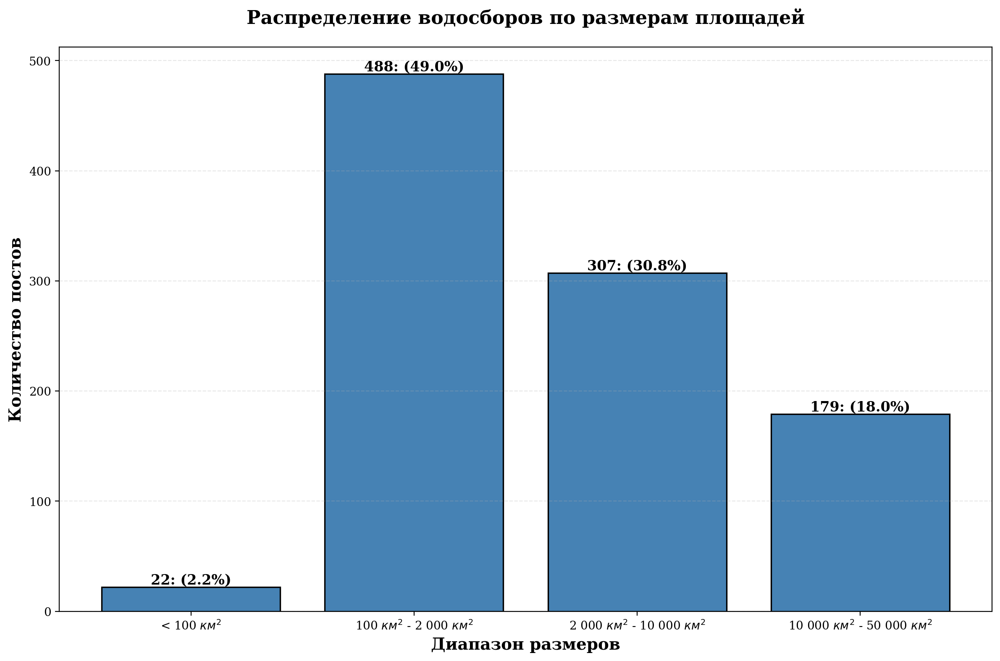

2025-11-26 11:58:36 | INFO     | PhDLogger | chapter_one | ℹ️  Watershed size distribution analysis complete


In [3]:
# Compute statistics
size_counts = ws["size"].value_counts(sort=False).sort_index()
total_gauges = len(ws)

# Create summary DataFrame
size_summary = pd.DataFrame(
    {
        "Size Category": size_counts.index,
        "Count": size_counts.values,
        "Percentage": (size_counts.values / total_gauges * 100).round(2),
    }
)

# Calculate area statistics per category
area_stats = []
for cat in get_size_categories():
    cat_data = ws[ws["size"] == cat]["area_km2"]
    area_stats.append(
        {
            "Category": cat,
            "Min (km²)": cat_data.min(),
            "Mean (km²)": cat_data.mean(),
            "Median (km²)": cat_data.median(),
            "Max (km²)": cat_data.max(),
        }
    )
area_stats_df = pd.DataFrame(area_stats)


# Plot distribution
fig, ax = plt.subplots(figsize=(12, 8))
bars = ax.bar(
    range(len(size_counts)),
    size_counts.values,
    color="steelblue",
    edgecolor="black",
    linewidth=1.2,
)
ax.set_xticks(range(len(size_counts)))
ax.set_xticklabels(
    [cat.split(") ")[1] for cat in size_counts.index], rotation=0, ha="center"
)
ax.set_xlabel("Диапазон размеров", fontsize=14, fontweight="bold")
ax.set_ylabel("Количество постов", fontsize=14, fontweight="bold")
ax.set_title(
    "Распределение водосборов по размерам площадей",
    fontsize=16,
    fontweight="bold",
    pad=20,
)
ax.grid(axis="y", alpha=0.3, linestyle="--")

# Add value labels
for rect, cnt in zip(bars, size_counts.values, strict=False):
    pct = cnt / total_gauges * 100
    ax.text(
        rect.get_x() + rect.get_width() / 2,
        rect.get_height(),
        f"{cnt}: ({pct:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
    )

fig.tight_layout()
fig.savefig(f"{img_dir}/watershed_size_distribution.png", dpi=300, bbox_inches="tight")
plt.show()

log.info("Watershed size distribution analysis complete")


### Geographical Clusters Data


In [4]:
# Load HydroATLAS data
geo_data = pd.read_csv(
    "../data/attributes/hydro_atlas_cis_camels.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
static_parameters = [
    "for_pc_use",
    "crp_pc_use",
    "inu_pc_ult",
    "ire_pc_use",
    "lka_pc_use",
    "prm_pc_use",
    "pst_pc_use",
    "cly_pc_uav",
    "slt_pc_uav",
    "snd_pc_uav",
    "kar_pc_use",
    "urb_pc_use",
    "gwt_cm_sav",
    "lkv_mc_usu",
    "rev_mc_usu",
    "slp_dg_uav",
    "sgr_dk_sav",
    "ws_area",
    "ele_mt_uav",
]
geo_subset = geo_data.loc[common_index, static_parameters]

# Scale to 0-1 range
geo_scaled = (geo_subset - geo_subset.min()) / (geo_subset.max() - geo_subset.min())

available_features = geo_scaled.loc[:, static_parameters].columns


In [5]:
log.info(f"Selected {len(available_features)} HydroATLAS features")
print(f"Features: {list(available_features)}")

feature_descriptions = {
    "for_pc_use": {
        "name": "Forest Cover",
        "description": "Percentage of forest area within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Vegetation",
        "hydrological_impact": "Controls evapotranspiration rates through canopy interception and transpiration. Moderates peak flows by increasing infiltration and soil water storage. Reduces surface runoff generation and sediment transport. Critical for baseflow maintenance during dry periods.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "crp_pc_use": {
        "name": "Cropland Extent",
        "description": "Percentage of agricultural cropland within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Introduces seasonal hydrological variability tied to agricultural cycles. Increases surface runoff due to soil compaction and reduced vegetation cover. May alter natural flow regimes through irrigation water extraction. Affects nutrient and sediment transport patterns.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "inu_pc_ult": {
        "name": "Inundation-Prone Areas",
        "description": "Percentage of areas susceptible to inundation within the total upstream watershed",
        "suffix": "ult",
        "category": "Flood & Water Regulation",
        "hydrological_impact": "Indicates natural flood storage capacity and wetland presence. Attenuates flood peaks through temporary water storage. Reduces flow variability and provides ecological buffer zones. Critical for understanding watershed flood risk and water regulation services.",
        "units": "%",
        "source": "GIEMS, MODIS",
    },
    "ire_pc_use": {
        "name": "Irrigated Area",
        "description": "Percentage of irrigated agricultural land within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Directly reduces streamflow through water abstraction for irrigation. Alters natural flow regime and seasonal discharge patterns. May increase return flows and groundwater recharge in some areas. Critical indicator of anthropogenic water stress.",
        "units": "%",
        "source": "GMIA, FAO",
    },
    "lka_pc_use": {
        "name": "Lake Coverage",
        "description": "Percentage of lake area within the upstream watershed extent",
        "suffix": "use",
        "category": "Hydrology & Water Storage",
        "hydrological_impact": "Provides natural flow regulation and dampens hydrological variability. Delays hydrological response to precipitation events. Increases evaporation losses and modifies water temperature. Critical for understanding flow attenuation and storage capacity.",
        "units": "%",
        "source": "HydroLAKES, GLWD",
    },
    "prm_pc_use": {
        "name": "Permafrost Extent",
        "description": "Percentage of permafrost area within the upstream watershed extent",
        "suffix": "use",
        "category": "Cryosphere & Soil Properties",
        "hydrological_impact": "Severely restricts soil infiltration capacity, leading to high surface runoff. Creates extreme seasonal discharge patterns with minimal winter flow. Highly sensitive to climate warming with potential for regime shifts. Controls subsurface flow pathways and groundwater recharge.",
        "units": "%",
        "source": "NSIDC",
    },
    "pst_pc_use": {
        "name": "Pasture Coverage",
        "description": "Percentage of pasture and grazing land within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Moderate infiltration capacity between forest and cropland. Grazing pressure may cause soil compaction affecting runoff generation. Less seasonal variability compared to cropland. Affects sediment yield and water quality through livestock impacts.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "cly_pc_uav": {
        "name": "Clay Content",
        "description": "Percentage of clay in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "Low hydraulic conductivity restricts infiltration and promotes surface runoff. High water retention capacity but limited drainage. Increases flood risk during intense precipitation. Controls soil moisture dynamics and groundwater recharge potential.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "slt_pc_uav": {
        "name": "Silt Content",
        "description": "Percentage of silt in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "Moderate infiltration and water-holding capacity between clay and sand. High susceptibility to erosion and sediment transport. Influences soil crusting which affects runoff generation. Critical for understanding sediment dynamics and water quality.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "snd_pc_uav": {
        "name": "Sand Content",
        "description": "Percentage of sand in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "High hydraulic conductivity promotes rapid infiltration and groundwater recharge. Low water retention leads to reduced surface runoff but also lower soil moisture availability. Favors baseflow-dominated discharge regimes. Critical for aquifer recharge assessment.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "kar_pc_use": {
        "name": "Karst Area",
        "description": "Percentage of karst terrain within the upstream watershed extent",
        "suffix": "use",
        "category": "Hydrogeology & Baseflow",
        "hydrological_impact": "Subsurface flow dominates over surface runoff through dissolution features. Spring-fed baseflow provides stable discharge during dry periods. Complex groundwater-surface water interactions. May exhibit losing/gaining stream reaches and high spatial flow variability.",
        "units": "%",
        "source": "WOKAM, GLHYMPS",
    },
    "urb_pc_use": {
        "name": "Urban Area",
        "description": "Percentage of urban and built-up area within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Impervious surfaces generate rapid runoff and flashy hydrographs. Dramatically reduces infiltration and groundwater recharge. Increases flood peaks and decreases baseflow. Critical indicator of hydrological regime alteration and water quality degradation.",
        "units": "%",
        "source": "GLC2000, MODIS",
    },
    "gwt_cm_uav": {
        "name": "Groundwater Table Depth",
        "description": "Depth to groundwater table in centimeters, sub-basin area-weighted average",
        "suffix": "uav",
        "category": "Hydrogeology & Baseflow",
        "hydrological_impact": "Shallow water tables enhance baseflow contribution and maintain perennial flow. Deep water tables limit groundwater-surface water exchange. Controls riparian vegetation and wetland distribution. Critical for understanding drought resilience and low-flow characteristics.",
        "units": "cm",
        "source": "Fan et al. 2013",
    },
    "lkv_mc_usu": {
        "name": "Lake Volume",
        "description": "Total volume of lakes within the upstream watershed, summed upstream",
        "suffix": "usu",
        "category": "Hydrology & Water Storage",
        "hydrological_impact": "Quantifies total natural storage capacity affecting flow regulation. Large volumes dampen seasonal variability and moderate extreme events. Increases residence time and evaporation losses. Critical for understanding watershed buffering capacity and drought resilience.",
        "units": "million m³",
        "source": "HydroLAKES",
    },
    "rev_mc_usu": {
        "name": "Reservoir Volume",
        "description": "Total volume of reservoirs within the upstream watershed, summed upstream",
        "suffix": "usu",
        "category": "Hydrology & Anthropogenic Impact",
        "hydrological_impact": "Represents artificial flow regulation capacity through dam operations. Modifies natural flow regime according to management objectives. Reduces peak flows and increases low flows depending on operation rules. Critical for understanding anthropogenic hydrological alteration.",
        "units": "million m³",
        "source": "GRanD, HydroLAKES",
    },
    "slp_dg_uav": {
        "name": "Terrain Slope",
        "description": "Mean terrain slope in degrees, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Topography & Physiography",
        "hydrological_impact": "Steep slopes accelerate runoff generation and reduce infiltration time. Controls flow velocity and time of concentration. Increases erosion potential and sediment transport. Critical for understanding flashiness and flood response timing.",
        "units": "degrees",
        "source": "SRTM, HydroSHEDS",
    },
    "sgr_dk_uav": {
        "name": "Stream Gradient",
        "description": "Stream channel gradient in decimal form, sub-basin area-weighted average",
        "suffix": "uav",
        "category": "Topography & River Morphology",
        "hydrological_impact": "Controls flow velocity and energy dissipation in the channel network. Steep gradients increase transport capacity for sediment and debris. Affects channel erosion, deposition patterns, and habitat structure. Critical for understanding hydraulic characteristics and geomorphic processes.",
        "units": "decimal",
        "source": "HydroSHEDS",
    },
    "ws_area": {
        "name": "Watershed Area",
        "description": "Total drainage area of the watershed",
        "suffix": "n/a",
        "category": "Topography & Physiography",
        "hydrological_impact": "Fundamental control on discharge magnitude and hydrological response. Larger watersheds exhibit dampened, delayed responses and higher baseflow contributions. Controls scaling relationships for flood peaks and low flows. Essential for understanding discharge regime and comparative hydrology.",
        "units": "km²",
        "source": "HydroSHEDS",
    },
    "ele_mt_uav": {
        "name": "Mean Elevation",
        "description": "Mean elevation in meters above sea level, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Topography & Climate",
        "hydrological_impact": "Controls precipitation amount through orographic enhancement. Determines snowmelt versus rainfall-dominated regimes. Affects temperature, evapotranspiration rates, and vegetation zones. Critical for understanding vertical climate gradients and seasonal discharge patterns.",
        "units": "m",
        "source": "SRTM, HydroSHEDS",
    },
}
russian_names = {
    "for_pc_use": "Лесистость",
    "crp_pc_use": "Пахотные земли",
    "inu_pc_ult": "Затапливаемые территории",
    "ire_pc_use": "Орошаемые территории",
    "lka_pc_use": "Озерность",
    "prm_pc_use": "Мерзлотные территории",
    "pst_pc_use": "Пастбища",
    "cly_pc_uav": "Глинистость",
    "slt_pc_uav": "Осадочные породы",
    "snd_pc_uav": "Песчаные породы",
    "kar_pc_use": "Карстовые породы",
    "urb_pc_use": "Урбанизированные территории",
    "gwt_cm_uav": "Глубина первого водоносного горизонта",
    "slp_dg_uav": "Средний уклон водосбора",
    "sgr_dk_uav": "Средний уклон речной сети",
    "lkv_mc_usu": "Объём озёр",
    "rev_mc_usu": "Объём водохранилищ",
    "ws_area": "Площадь водосбора",
    "ele_mt_uav": "Средняя высота водосбора",
}
# Create DataFrame for display
feature_df = pd.DataFrame.from_dict(feature_descriptions, orient="index")
feature_df.index.name = "HydroATLAS Code"
feature_df = feature_df.reset_index()

# Reorder columns
feature_df = feature_df[
    [
        "HydroATLAS Code",
        "name",
        "description",
        "suffix",
        "units",
        "category",
        "hydrological_impact",
        "source",
    ]
]

# Rename columns for clarity
feature_df.columns = [
    "HydroATLAS Code",
    "Short Name",
    "Full Description",
    "Suffix",
    "Units",
    "Category",
    "Hydrological Impact",
    "Data Source",
]

feature_df


2025-11-26 11:58:36 | INFO     | PhDLogger | chapter_one | ℹ️  Selected 19 HydroATLAS features


Features: ['for_pc_use', 'crp_pc_use', 'inu_pc_ult', 'ire_pc_use', 'lka_pc_use', 'prm_pc_use', 'pst_pc_use', 'cly_pc_uav', 'slt_pc_uav', 'snd_pc_uav', 'kar_pc_use', 'urb_pc_use', 'gwt_cm_sav', 'lkv_mc_usu', 'rev_mc_usu', 'slp_dg_uav', 'sgr_dk_sav', 'ws_area', 'ele_mt_uav']


,HydroATLAS Code,Short Name,Full Description,Suffix,Units,Category,Hydrological Impact,Data Source
0,for_pc_use,Forest Cover,Percentage of forest area within the upstream ...,use,%,Land Cover & Vegetation,Controls evapotranspiration rates through cano...,"GLC2000, GlobCover"
1,crp_pc_use,Cropland Extent,Percentage of agricultural cropland within the...,use,%,Land Cover & Human Impact,Introduces seasonal hydrological variability t...,"GLC2000, GlobCover"
2,inu_pc_ult,Inundation-Prone Areas,Percentage of areas susceptible to inundation ...,ult,%,Flood & Water Regulation,Indicates natural flood storage capacity and w...,"GIEMS, MODIS"
3,ire_pc_use,Irrigated Area,Percentage of irrigated agricultural land with...,use,%,Land Cover & Human Impact,Directly reduces streamflow through water abst...,"GMIA, FAO"
4,lka_pc_use,Lake Coverage,Percentage of lake area within the upstream wa...,use,%,Hydrology & Water Storage,Provides natural flow regulation and dampens h...,"HydroLAKES, GLWD"
5,prm_pc_use,Permafrost Extent,Percentage of permafrost area within the upstr...,use,%,Cryosphere & Soil Properties,"Severely restricts soil infiltration capacity,...",NSIDC
6,pst_pc_use,Pasture Coverage,Percentage of pasture and grazing land within ...,use,%,Land Cover & Human Impact,Moderate infiltration capacity between forest ...,"GLC2000, GlobCover"
7,cly_pc_uav,Clay Content,"Percentage of clay in topsoil, area-weighted a...",uav,%,Soil Properties,Low hydraulic conductivity restricts infiltrat...,"SoilGrids, HWSD"
8,slt_pc_uav,Silt Content,"Percentage of silt in topsoil, area-weighted a...",uav,%,Soil Properties,Moderate infiltration and water-holding capaci...,"SoilGrids, HWSD"
9,snd_pc_uav,Sand Content,"Percentage of sand in topsoil, area-weighted a...",uav,%,Soil Properties,High hydraulic conductivity promotes rapid inf...,"SoilGrids, HWSD"


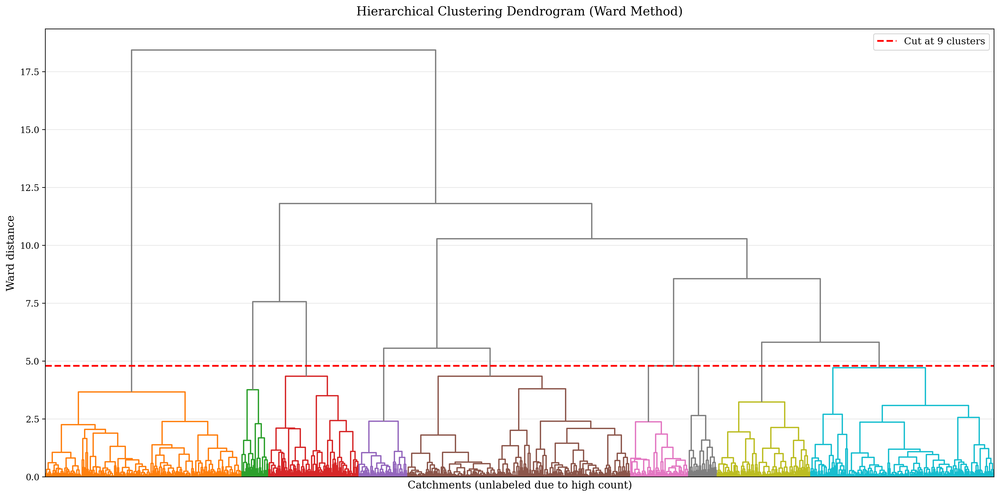

In [6]:
cluster_number = 9
# Compute linkage matrix
Z = linkage(geo_scaled.values, method="ward", metric="euclidean")

# Plot dendrogram (without x-axis labels due to many gauges)
fig, ax = plt.subplots(figsize=(16, 8))
dendro = dendrogram(
    Z,
    ax=ax,
    above_threshold_color="#808080",
    color_threshold=Z[-cluster_number + 1, 2],
    no_labels=True,  # Don't show gauge IDs on x-axis
)

ax.set_xlabel("Catchments (unlabeled due to high count)", fontsize=12)
ax.set_ylabel("Ward distance", fontsize=12)
ax.set_title("Hierarchical Clustering Dendrogram (Ward Method)", fontsize=14, pad=15)
ax.axhline(
    y=Z[-cluster_number + 1, 2],
    color="r",
    linestyle="--",
    linewidth=2,
    label=f"Cut at {cluster_number} clusters",
)
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

fig.savefig(
    f"{img_dir}/geo_dendrogram_ward_{cluster_number}_clusters.png",
    dpi=300,
    bbox_inches="tight",
)
plt.tight_layout()
plt.show()


In [7]:
hierarchical_labels = fcluster(Z, t=cluster_number, criterion="maxclust")

# Add to dataframes
geo_scaled["cluster_geo"] = hierarchical_labels
gauges["cluster_geo"] = hierarchical_labels

# Compute cluster centroids (0-1 normalized values)
cluster_centroids = geo_scaled.groupby("cluster_geo")[available_features].mean()

# Compute raw (original scale) centroids for interpretation
geo_subset["cluster_geo"] = hierarchical_labels
cluster_centroids_raw = geo_subset.groupby("cluster_geo")[available_features].mean()


# CRITICAL: Use only feature columns, exclude cluster_geo
scaled_values = geo_scaled[available_features].values
silhouette_avg = silhouette_score(scaled_values, hierarchical_labels)
silhouette_vals = silhouette_samples(scaled_values, hierarchical_labels)

ch_score = calinski_harabasz_score(scaled_values, hierarchical_labels)
db_score = davies_bouldin_score(scaled_values, hierarchical_labels)

print(f"Clustering validation metrics (k={cluster_number}):")
print(f"  Silhouette Score: {silhouette_avg:.3f}")
print(f"  Calinski-Harabasz: {ch_score:.1f}")
print(f"  Davies-Bouldin: {db_score:.3f}")

# Per-cluster silhouette
for cluster_id in range(1, cluster_number + 1):
    cluster_mask = hierarchical_labels == cluster_id
    cluster_sil = silhouette_vals[cluster_mask].mean()
    n_samples = cluster_mask.sum()
    print(f"  Cluster {cluster_id}: silhouette={cluster_sil:.3f}, n={n_samples}")

Clustering validation metrics (k=9):
  Silhouette Score: 0.243
  Calinski-Harabasz: 225.1
  Davies-Bouldin: 1.420
  Cluster 1: silhouette=0.450, n=206
  Cluster 2: silhouette=0.277, n=28
  Cluster 3: silhouette=0.112, n=95
  Cluster 4: silhouette=0.383, n=51
  Cluster 5: silhouette=0.177, n=234
  Cluster 6: silhouette=0.454, n=61
  Cluster 7: silhouette=0.157, n=30
  Cluster 8: silhouette=0.130, n=98
  Cluster 9: silhouette=0.128, n=193


Variance explained by principal components:
  PC1: 36.50% (cumulative: 36.50%)
  PC2: 19.89% (cumulative: 56.39%)
  PC3: 14.53% (cumulative: 70.92%)
  PC4: 7.76% (cumulative: 78.68%)
  PC5: 6.41% (cumulative: 85.09%)


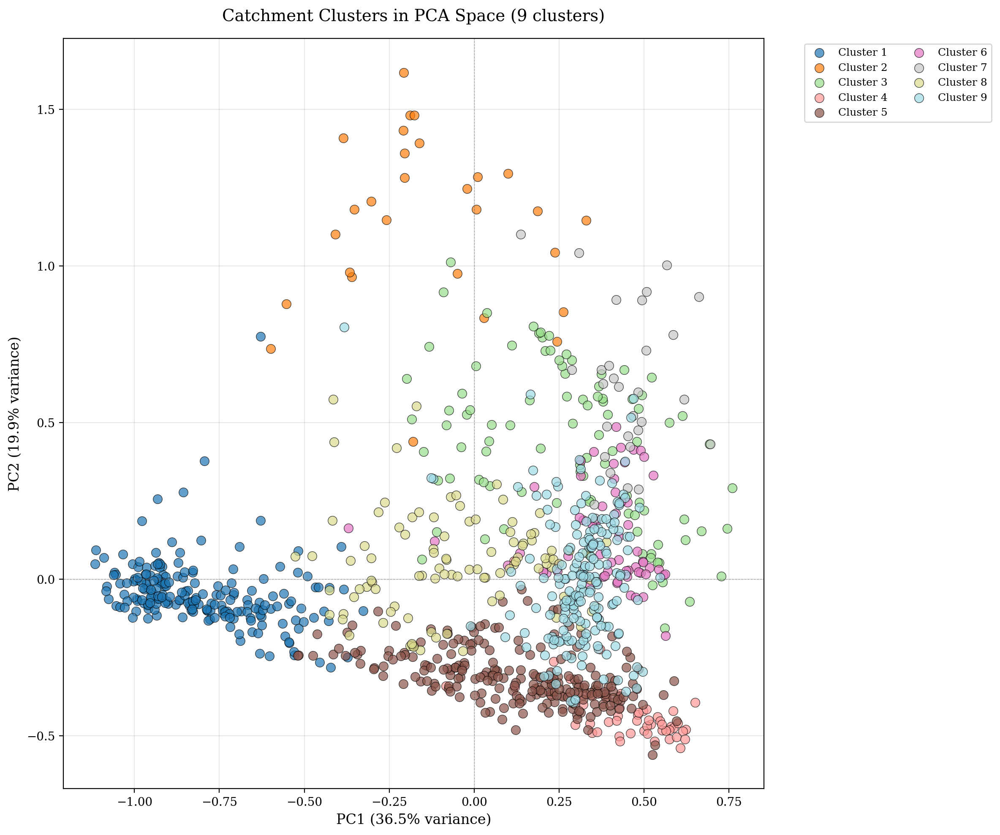

In [8]:
# Perform PCA on feature columns only (exclude Cluster_HC)
pca = PCA(n_components=min(10, len(available_features)))
pca_features = pca.fit_transform(scaled_values)

pca_df = pd.DataFrame(
    pca_features,
    columns=[f"PC{i + 1}" for i in range(pca.n_components_)],
    index=geo_scaled.index,
)
pca_df["cluster_geo"] = hierarchical_labels

variance_explained = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(variance_explained)

# Print variance explained by first few components
print("Variance explained by principal components:")
for i in range(min(5, pca.n_components_)):
    print(
        f"  PC{i + 1}: {variance_explained[i] * 100:.2f}% (cumulative: {cumulative_variance[i] * 100:.2f}%)"
    )

# Plot
fig, ax = plt.subplots(figsize=(12, 10))
cmap = plt.get_cmap("tab20", cluster_number)
colors_pca = [cmap(i) for i in range(cluster_number)]

for cluster_id in range(1, cluster_number + 1):
    cluster_mask = pca_df["cluster_geo"] == cluster_id
    cluster_data = pca_df[cluster_mask]

    ax.scatter(
        cluster_data["PC1"],
        cluster_data["PC2"],
        c=[colors_pca[cluster_id - 1]],
        label=f"Cluster {cluster_id}",
        s=60,
        alpha=0.7,
        edgecolors="black",
        linewidth=0.5,
    )

ax.set_xlabel(f"PC1 ({variance_explained[0] * 100:.1f}% variance)", fontsize=12)
ax.set_ylabel(f"PC2 ({variance_explained[1] * 100:.1f}% variance)", fontsize=12)
ax.set_title(
    f"Catchment Clusters in PCA Space ({cluster_number} clusters)", fontsize=14, pad=15
)
ax.axhline(y=0, color="k", linestyle="--", linewidth=0.5, alpha=0.3)
ax.axvline(x=0, color="k", linestyle="--", linewidth=0.5, alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

fig.savefig(
    f"{img_dir}/geo_pca_{cluster_number}_clusters.png", dpi=300, bbox_inches="tight"
)
plt.tight_layout()
plt.show()


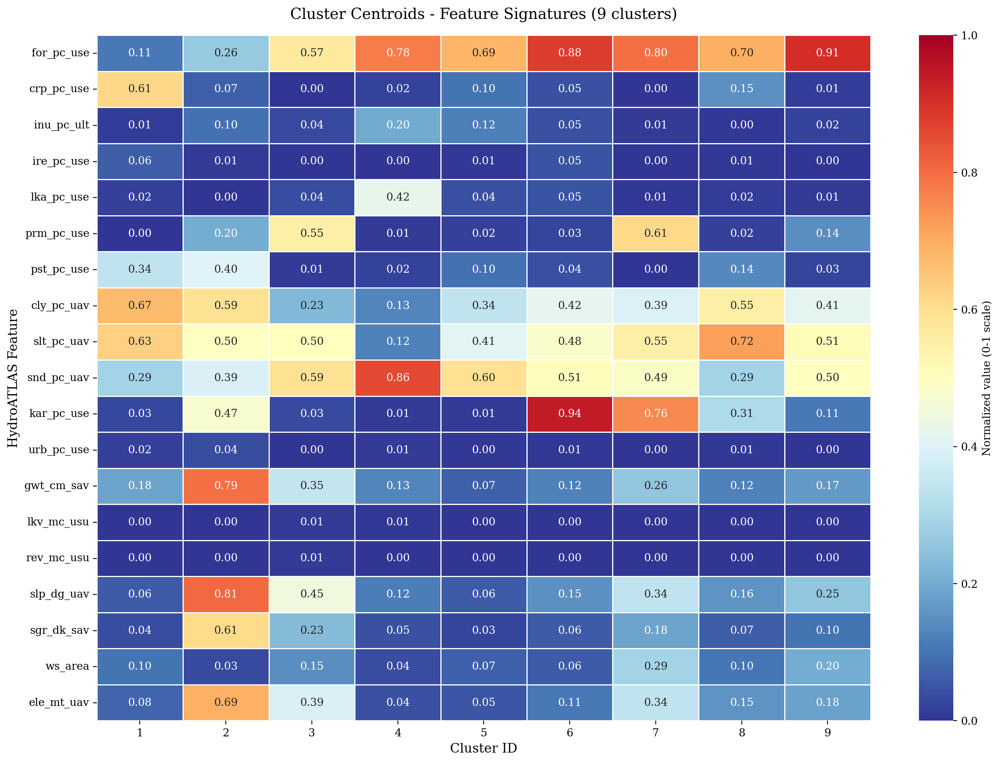

In [9]:
# Plot heatmap with 0-1 normalized values
fig, ax = plt.subplots(figsize=(14, 10))

sns.heatmap(
    cluster_centroids.T,
    cmap="RdYlBu_r",
    center=0.5,
    vmin=0,
    vmax=1,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Normalized value (0-1 scale)"},
    linewidths=0.5,
    ax=ax,
)

ax.set_xlabel("Cluster ID", fontsize=12)
ax.set_ylabel("HydroATLAS Feature", fontsize=12)
ax.set_title(
    f"Cluster Centroids - Feature Signatures ({cluster_number} clusters)",
    fontsize=14,
    pad=15,
)

fig.savefig(
    f"{img_dir}/geo_cluster_heatmap_{cluster_number}.png",
    dpi=300,
    bbox_inches="tight",
)
plt.tight_layout()
plt.show()


In [10]:
# Export cluster assignments
output_path = Path(f"{table_dir}/geo_catchment_clusters_{cluster_number}_final.csv")
export_df = pd.DataFrame(
    {
        "gauge_id": geo_scaled.index,
        "cluster_id": hierarchical_labels,
        "cluster_name": [f"Cluster {cl}" for cl in hierarchical_labels],
        "silhouette_score": silhouette_vals,
    }
)
export_df.to_csv(output_path, index=False)

# Export cluster centroids (both normalized and raw)
centroids_path_norm = Path(
    f"{table_dir}/geo_cluster_centroids_{cluster_number}_normalized.csv"
)
centroids_path_raw = Path(f"{table_dir}/geo_cluster_centroids_{cluster_number}_raw.csv")

cluster_centroids.to_csv(centroids_path_norm)
cluster_centroids_raw.to_csv(centroids_path_raw)

print(f"Exported cluster assignments to: {output_path}")
print(f"Exported normalized centroids to: {centroids_path_norm}")
print(f"Exported raw centroids to: {centroids_path_raw}")

log.info(f"Analysis complete: {cluster_number} clusters identified")


2025-11-26 11:58:38 | INFO     | PhDLogger | chapter_one | ℹ️  Analysis complete: 9 clusters identified


Exported cluster assignments to: ../res/chapter_one/geo_analysis/tables/geo_catchment_clusters_9_final.csv
Exported normalized centroids to: ../res/chapter_one/geo_analysis/tables/geo_cluster_centroids_9_normalized.csv
Exported raw centroids to: ../res/chapter_one/geo_analysis/tables/geo_cluster_centroids_9_raw.csv


Generated cluster names:
  Cluster 1 (n=206): Clay-rich (19.4%)
  Cluster 2 (n=28): Steep (23.1°) / Deep-GW
  Cluster 3 (n=95): Hilly (12.9) / Mid-elevation (1166m)
  Cluster 4 (n=51): Sandy (62.4%)
  Cluster 5 (n=234): Wetland (11.2) / Semi-arid (0mm/yr)
  Cluster 6 (n=61): Karst (93.6%) / Heavily Forested
  Cluster 7 (n=30): Karst (75.4%)
  Cluster 8 (n=98): Silty (47.6%)
  Cluster 9 (n=193): Heavily Forested (90.0%)


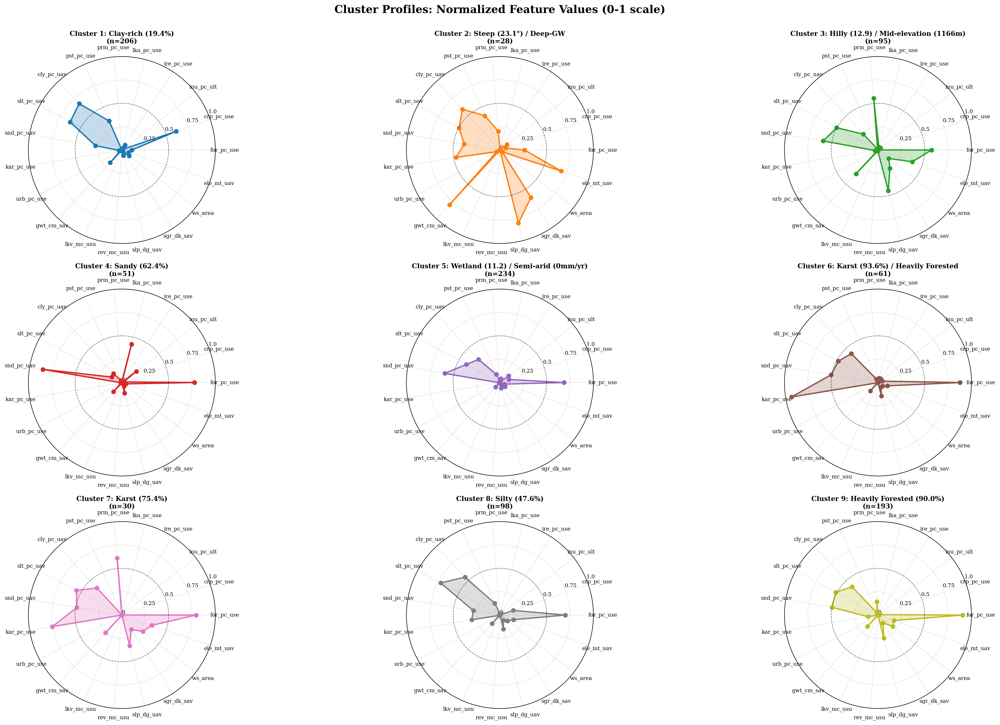


Color/Marker mapping verification:
  Cluster 1: uses color index 0 (color: #1f77b4)
  Cluster 2: uses color index 1 (color: #ff7f0e)
  Cluster 3: uses color index 2 (color: #2ca02c)
  Cluster 4: uses color index 3 (color: #d62728)
  Cluster 5: uses color index 4 (color: #9467bd)
  Cluster 6: uses color index 5 (color: #8c564b)
  Cluster 7: uses color index 6 (color: #e377c2)
  Cluster 8: uses color index 7 (color: #7f7f7f)
  Cluster 9: uses color index 8 (color: #bcbd22)


In [11]:
# Get markers and colors for clusters
markers_hc = get_cluster_markers(cluster_number)
colors_hc = get_cluster_colors(cluster_number)
marker_corrections = get_marker_size_corrections()

# Compute cluster centroids (0-1 normalized values)
cluster_centroids = geo_scaled.groupby("cluster_geo")[available_features].mean()

# Also compute raw centroids for interpretation
cluster_centroids_raw = geo_subset.groupby("cluster_geo")[available_features].mean()

# Generate cluster names using both normalized and raw values
cluster_names = pd.Series(index=range(1, cluster_number + 1), dtype=str)
for cluster_id in range(1, cluster_number + 1):
    normalized_row = cluster_centroids.loc[cluster_id, :]
    raw_row = cluster_centroids_raw.loc[cluster_id, :]
    cluster_names[cluster_id] = interpret_cluster_from_data(
        normalized_row, raw_row, feature_descriptions
    )

cluster_names.index.name = "Cluster"

print("Generated cluster names:")
for cid, name in cluster_names.items():
    n_catch = (hierarchical_labels == cid).sum()
    print(f"  Cluster {cid} (n={n_catch}): {name}")

# Create display names with cluster ID prefix for map legend
cluster_display_names = pd.Series(index=range(1, cluster_number + 1), dtype=str)
for cid in range(1, cluster_number + 1):
    cluster_display_names[cid] = f"C{cid}: {cluster_names[cid]}"

# Create radar charts for each cluster
n_features_display = len(available_features)
angles = np.linspace(0, 2 * np.pi, n_features_display, endpoint=False).tolist()
angles += angles[:1]  # Complete the circle

# Setup subplot grid
n_cols = 3
n_rows = int(np.ceil(cluster_number / n_cols))
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(25, n_rows * 5),
    subplot_kw={"projection": "polar"},
)
axes = axes.flatten() if cluster_number > 1 else [axes]

for idx, cluster_id in enumerate(range(1, cluster_number + 1)):
    ax = axes[idx]

    # Get centroid values (0-1 normalized)
    values = cluster_centroids.loc[cluster_id, available_features].tolist()
    values += values[:1]  # Complete the circle

    # Use cluster_id - 1 to index colors (ensures Cluster 1 uses colors_hc[0])
    color_idx = cluster_id - 1

    # Plot
    ax.plot(
        angles,
        values,
        "o-",
        linewidth=2,
        color=colors_hc[color_idx],
        label=cluster_names[cluster_id],
    )
    ax.fill(angles, values, alpha=0.25, color=colors_hc[color_idx])

    # Styling
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(available_features, size=8)
    ax.set_ylim(0, 1)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["0", "0.25", "0.5", "0.75", "1.0"], size=8)
    ax.grid(True, alpha=0.3)

    # Title with cluster size and name
    n_catchments = (hierarchical_labels == cluster_id).sum()
    ax.set_title(
        f"Cluster {cluster_id}: {cluster_names[cluster_id]}\n(n={n_catchments})",
        size=10,
        weight="bold",
        pad=20,
    )

    # Add median line (0.5)
    ax.axhline(y=0.5, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

# Remove empty subplots
for idx in range(cluster_number, len(axes)):
    fig.delaxes(axes[idx])

plt.suptitle(
    "Cluster Profiles: Normalized Feature Values (0-1 scale)",
    fontsize=16,
    y=1.00,
    weight="bold",
)
plt.tight_layout()
fig.savefig(
    f"{img_dir}/geo_cluster_radar_{cluster_number}_profiles.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("\nColor/Marker mapping verification:")
for cid in range(1, cluster_number + 1):
    color_idx = cid - 1
    print(
        f"  Cluster {cid}: uses color index {color_idx} (color: {colors_hc[color_idx]})"
    )


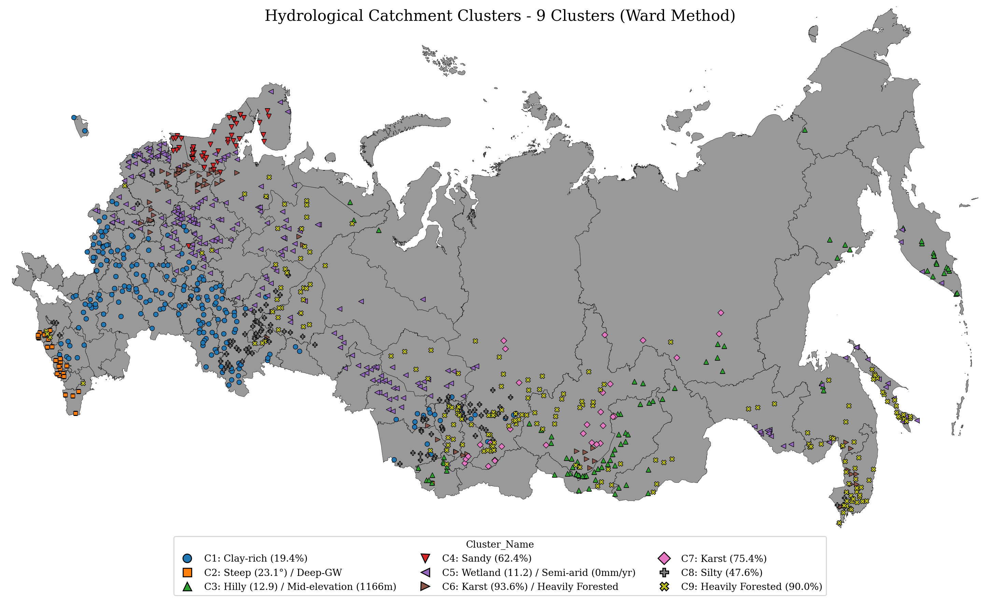

In [12]:
# Prepare cluster names for geographic visualization
gauge_clustered = gauges.copy()
# Use display names with "C{id}:" prefix so sorting works correctly
gauge_clustered["Cluster_Name"] = [
    cluster_display_names[cl] for cl in hierarchical_labels
]

# Plot map with proper cluster names
fig_clusters_map = russia_plots(
    gdf_to_plot=gauge_clustered,
    basemap_data=basemap_data,
    distinction_col="Cluster_Name",
    markers_list=markers_hc,
    color_list=colors_hc,
    marker_size_corrections=marker_corrections,
    figsize=(16, 9),
    just_points=True,
    legend_cols=3,
    base_marker_size=25,
    base_linewidth=0.5,
)

fig_clusters_map.suptitle(
    f"Hydrological Catchment Clusters - {cluster_number} Clusters (Ward Method)",
    fontsize=16,
    y=0.98,
)
fig_clusters_map.savefig(
    f"{img_dir}/geo_hierarchical_{cluster_number}clusters_map.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()


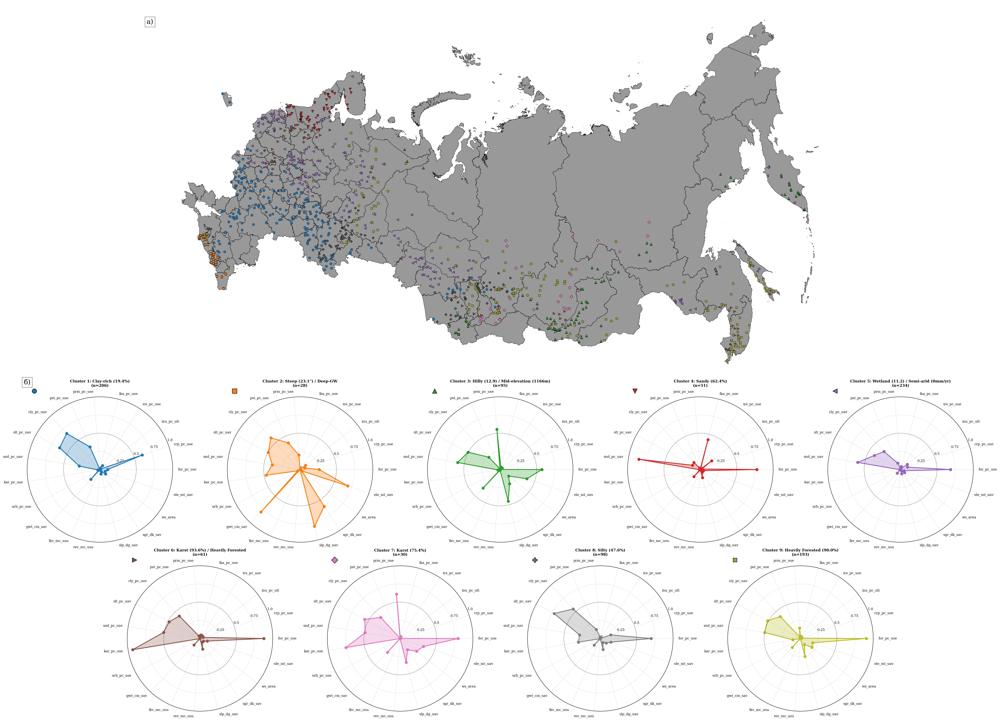

In [13]:
# ── Bigger canvas + finer GridSpec resolution
fig = plt.figure(figsize=(32, 26))  # wider & taller
gs = gridspec.GridSpec(nrows=14, ncols=9, figure=fig, wspace=0.18, hspace=0.26)


###############################################################################
aea_crs = ccrs.AlbersEqualArea(
    central_longitude=100,
    standard_parallels=(50, 70),
    central_latitude=56,
    false_easting=0,
    false_northing=0,
)
# to proj4 form
aea_crs_proj4 = aea_crs.proj4_init

gdf_to_plot = gauge_clustered
distinction_col = "Cluster_Name"
legend_cols = 5
base_marker_size = 28
base_linewidth = 0.5
legend_loc = "upper center"

# ── TOP: Map spans rows 0..6 over all columns
ax1 = fig.add_subplot(gs[0:7, :], projection=aea_crs)
ax1.set_aspect("equal")
ax1.axis("off")

# Plot basemap
basemap_data.to_crs(aea_crs_proj4).plot(
    ax=ax1, color="grey", edgecolor="black", legend=False, alpha=0.8, linewidth=0.6
)

# Reproject data
gdf_proj = gdf_to_plot.to_crs(aea_crs_proj4)

# Get sorted categories
raw_cats = list(gdf_proj[distinction_col].astype(str).unique())
cats = sorted(
    raw_cats,
    key=lambda x: int(re.search(r"\d+", x).group())
    if re.search(r"\d+", x)
    else float("inf"),
)
n_cats = len(cats)

# Use markers and colors from the earlier russia_plots call
colors = np.array([plt.matplotlib.colors.to_rgba(c) for c in colors_hc])

# Variation tiers for repeated markers
size_variants = [1.0, 1.4, 1.8]
linewidth_variants = [1.0, 1.6, 2.2]
n_markers = len(markers_hc)

handles = []
# Plot each category with custom markers and colors
for i, cat in enumerate(cats):
    sub = gdf_proj[gdf_proj[distinction_col].astype(str) == cat]
    if sub.empty:
        continue
    xs = sub.geometry.x
    ys = sub.geometry.y

    # Choose marker and compute repetition index
    marker = markers_hc[i % n_markers]
    repeat_idx = i // n_markers
    size_factor = size_variants[repeat_idx % len(size_variants)]
    lw_factor = linewidth_variants[repeat_idx % len(linewidth_variants)]

    # Apply marker-specific size correction
    if marker in marker_corrections:
        size_factor *= marker_corrections[marker]

    # Choose color
    col = colors[i % len(colors)]

    size = int(base_marker_size * size_factor)
    linewidth = float(base_linewidth * lw_factor)

    ax1.scatter(
        xs,
        ys,
        marker=marker,
        s=size,
        c=[col],
        edgecolor="black",
        linewidth=linewidth,
        zorder=3,
    )

    # Create legend handle
    legend_size = max(4, int(0.45 * 20))
    handles.append(
        Line2D(
            [],
            [],
            marker=marker,
            color="black",
            markerfacecolor=col,
            markeredgecolor="black",
            linestyle="None",
            markersize=legend_size,
            label=str(cat),
        )
    )

draw_legend = False
# Draw legend if requested
if "draw_legend" in locals() and draw_legend and handles:
    ax1.legend(
        handles=handles,
        title=distinction_col,
        ncol=legend_cols,
        loc=legend_loc,
        frameon=True,
        fontsize=14,
    )

###############################################################################
# helpers/colors/markers
markers_hc = get_cluster_markers(cluster_number)
colors_hc = get_cluster_colors(cluster_number)
marker_corrections = get_marker_size_corrections()

# centroids & names
cluster_centroids = geo_scaled.groupby("cluster_geo")[available_features].mean()
cluster_centroids_raw = geo_subset.groupby("cluster_geo")[available_features].mean()

cluster_names = pd.Series(index=range(1, cluster_number + 1), dtype=str)
for cid in range(1, cluster_number + 1):
    cluster_names[cid] = interpret_cluster_from_data(
        cluster_centroids.loc[cid, :],
        cluster_centroids_raw.loc[cid, :],
        feature_descriptions,
    )
cluster_names.index.name = "Cluster"

# spokes
angles = np.linspace(0, 2 * np.pi, len(available_features), endpoint=False).tolist()
angles += angles[:1]

# --- centered, full-width middle area; tighter vertical gap ---
mid_area = gs[7:13, 0:9]  # use full width of outer 9 columns
radar_gs = mid_area.subgridspec(2, 19, wspace=0.10, hspace=0.10)
# top row: 5 panels with 1-col gutters  → [0:3], [4:7], [8:11], [12:15], [16:19]
# bottom : 4 panels shifted half-step   → [2:5], [6:9], [10:13], [14:17]
top_slices = [(0, 0, 3), (0, 4, 7), (0, 8, 11), (0, 12, 15), (0, 16, 19)]
bottom_slices = [(1, 2, 5), (1, 6, 9), (1, 10, 13), (1, 14, 17)]

max_panels = 9
if cluster_number > max_panels:
    warnings.warn(f"cluster_number={cluster_number} > 9; showing first 9 clusters.")
n_to_plot = min(cluster_number, max_panels)
top_count = min(5, n_to_plot)
bottom_cnt = min(4, n_to_plot - top_count)


def _add_ax(row, c0, c1):
    ax = fig.add_subplot(radar_gs[row, c0:c1], projection="polar")
    try:
        ax.set_box_aspect(1)  # square radars
    except Exception:
        ax.set_aspect(1.0, adjustable="box")
    return ax


axes = []
for k in range(top_count):
    axes.append(_add_ax(*top_slices[k]))
for k in range(bottom_cnt):
    axes.append(_add_ax(*bottom_slices[k]))


# nice, non-overlapping tick labels (tangential) + thinning
def _beautify_radar_ticks(ax, angles, labels, fs=8, pad=3, show_every=2):
    deg = np.degrees(angles[:-1])
    lbls = [lab if (i % show_every) == 0 else "" for i, lab in enumerate(labels)]
    ax.set_thetagrids(deg, lbls)
    for lab, d in zip(ax.get_xticklabels(), deg):
        # rotate tangentially
        rot = d - 90 if d <= 180 else d - 270
        lab.set_rotation(rot)
        lab.set_rotation_mode("anchor")
        lab.set_fontsize(fs)
        lab.set_verticalalignment("center")
        lab.set_horizontalalignment("left" if (d <= 90 or d >= 270) else "right")
    ax.tick_params(pad=pad)


# plot clusters
for idx, cid in enumerate(range(1, n_to_plot + 1)):
    ax = axes[idx]
    vals = cluster_centroids.loc[cid, available_features].tolist()
    vals += vals[:1]

    color_idx = (cid - 1) % len(colors_hc)
    mk = markers_hc[(cid - 1) % len(markers_hc)]

    ax.plot(angles, vals, "o-", linewidth=2.0, color=colors_hc[color_idx], zorder=2)
    ax.fill(angles, vals, alpha=0.28, color=colors_hc[color_idx], zorder=1)

    _beautify_radar_ticks(ax, angles, available_features, fs=8, pad=2, show_every=1)

    ax.set_ylim(0, 1.0)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["0", "0.25", "0.5", "0.75", "1.0"], fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.axhline(0.5, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

    n_catch = int((hierarchical_labels == cid).sum())
    ax.set_title(
        f"Cluster {cid}: {cluster_names[cid]}\n(n={n_catch})",
        fontsize=9,
        weight="bold",
        pad=8,  # smaller title + tighter pad
    )
    ax.scatter(
        0.05,
        1.04,
        marker=mk,
        s=110,
        c=[colors_hc[color_idx]],
        edgecolor="black",
        linewidth=1.0,
        transform=ax.transAxes,
        clip_on=False,
        zorder=3,
    )

# panel tags
ax1.text(
    0.0,
    0.95,
    "а)",
    transform=ax1.transAxes,
    fontsize=16,
    va="center",
    ha="center",
    bbox=dict(facecolor="white", alpha=0.5),
)
if axes:
    axes[0].text(
        0.0,
        1.10,
        "б)",
        transform=axes[0].transAxes,
        fontsize=16,
        va="center",
        ha="center",
        bbox=dict(facecolor="white", alpha=0.5),
    )

# avoid tight_layout with polar + cartopy; just use small margins
fig.subplots_adjust(left=0.02, right=0.985, top=0.985, bottom=0.02)
plt.show()

In [14]:
# Comprehensive per-gauge analysis with cluster characteristics

# Create detailed gauge-level report
gauge_analysis = pd.DataFrame(
    {
        "gauge_id": geo_scaled.index,
        "cluster_id": hierarchical_labels,
        "cluster_name": [cluster_names[cl] for cl in hierarchical_labels],
        "silhouette_score": silhouette_vals,
    }
)

# Add cluster size information
cluster_sizes = pd.Series(hierarchical_labels).value_counts().to_dict()
gauge_analysis["cluster_size"] = [cluster_sizes[cl] for cl in hierarchical_labels]

# Add distance from cluster centroid (normalized feature space)
distances_from_centroid = []
for idx, row_idx in enumerate(geo_scaled.index):
    gauge_cluster = hierarchical_labels[idx]
    gauge_features = scaled_values[idx]
    centroid_features = cluster_centroids.loc[gauge_cluster, available_features].values

    # Euclidean distance in normalized space
    dist = np.sqrt(np.sum((gauge_features - centroid_features) ** 2))
    distances_from_centroid.append(dist)

gauge_analysis["distance_from_centroid"] = distances_from_centroid

# Add representative status (is this gauge close to cluster center?)
# Gauges in bottom 25% of distance are "representative"
for cluster_id in range(1, cluster_number + 1):
    cluster_mask = gauge_analysis["cluster_id"] == cluster_id
    cluster_distances = gauge_analysis.loc[cluster_mask, "distance_from_centroid"]
    threshold_25 = cluster_distances.quantile(0.25)

    gauge_analysis.loc[cluster_mask, "is_representative"] = (
        cluster_distances <= threshold_25
    ).astype(bool)

# Add raw feature values for each gauge
for feat in available_features:
    gauge_analysis[f"raw_{feat}"] = geo_subset.loc[
        gauge_analysis["gauge_id"], feat
    ].values

# Add normalized feature values
for feat in available_features:
    gauge_analysis[f"norm_{feat}"] = geo_scaled.loc[
        gauge_analysis["gauge_id"], feat
    ].values

# Add PCA coordinates for spatial reference
gauge_analysis["PC1"] = pca_df.loc[gauge_analysis["gauge_id"], "PC1"].values
gauge_analysis["PC2"] = pca_df.loc[gauge_analysis["gauge_id"], "PC2"].values

# Add geographic coordinates
gauge_analysis["latitude"] = gauges.loc[gauge_analysis["gauge_id"]].geometry.y.values
gauge_analysis["longitude"] = gauges.loc[gauge_analysis["gauge_id"]].geometry.x.values
gauge_analysis["area_km2"] = ws.loc[gauge_analysis["gauge_id"], "area_km2"].values

print(f"Created comprehensive gauge analysis with {len(gauge_analysis)} gauges")
print(f"Total features per gauge: {len(gauge_analysis.columns)}")
print("\nRepresentative gauges per cluster:")
for cluster_id in range(1, cluster_number + 1):
    n_repr = gauge_analysis.loc[
        gauge_analysis["cluster_id"] == cluster_id, "is_representative"
    ].sum()
    n_total = (gauge_analysis["cluster_id"] == cluster_id).sum()
    print(f"  Cluster {cluster_id} ({cluster_names[cluster_id]}): {n_repr}/{n_total}")


# Generate concise hydrological notes for each gauge
def generate_gauge_note(row: pd.Series) -> str:
    """Generate descriptive note for individual gauge based on cluster membership and characteristics."""
    cluster_id = row["cluster_id"]
    cluster_name = row["cluster_name"]
    silhouette = row["silhouette_score"]
    is_repr = row["is_representative"]

    # Build note
    note_parts = [f"Cluster {cluster_id}: {cluster_name}"]

    # Silhouette interpretation
    if silhouette > 0.3:
        note_parts.append(f"good fit (sil={silhouette:.2f})")
    elif silhouette > 0.1:
        note_parts.append(f"moderate fit (sil={silhouette:.2f})")
    else:
        note_parts.append(f"weak fit (sil={silhouette:.2f})")

    if is_repr:
        note_parts.append("representative gauge")

    # Key hydrological characteristics (using only features from clustering)
    # Build feature-value pairs with priority scoring
    feature_scores = []

    # Critical features (highest priority)
    if row["raw_prm_pc_use"] > 20:
        feature_scores.append(
            (row["raw_prm_pc_use"], f"permafrost {row['raw_prm_pc_use']:.0f}%", 3)
        )
    if row["raw_kar_pc_use"] > 15:
        feature_scores.append(
            (row["raw_kar_pc_use"], f"karst {row['raw_kar_pc_use']:.0f}%", 3)
        )
    if row["raw_urb_pc_use"] > 3:
        feature_scores.append(
            (row["raw_urb_pc_use"], f"urban {row['raw_urb_pc_use']:.1f}%", 3)
        )

    # Important features (medium priority)
    if row["raw_lka_pc_use"] > 3:
        feature_scores.append(
            (row["raw_lka_pc_use"], f"lake {row['raw_lka_pc_use']:.1f}%", 2)
        )
    if row["raw_crp_pc_use"] > 25:
        feature_scores.append(
            (row["raw_crp_pc_use"], f"cropland {row['raw_crp_pc_use']:.0f}%", 2)
        )
    if row["raw_ire_pc_use"] > 5:
        feature_scores.append(
            (row["raw_ire_pc_use"], f"irrigation {row['raw_ire_pc_use']:.1f}%", 2)
        )
    if row["raw_rev_mc_usu"] > 100:
        feature_scores.append(
            (row["raw_rev_mc_usu"], f"reservoir {row['raw_rev_mc_usu']:.0f}Mm³", 2)
        )
    if row["raw_slp_dg_uav"] > 5:
        feature_scores.append(
            (row["raw_slp_dg_uav"], f"slope {row['raw_slp_dg_uav']:.1f}°", 2)
        )

    # Topographic features
    if row["raw_ele_mt_uav"] > 800:
        feature_scores.append(
            (row["raw_ele_mt_uav"], f"elev {row['raw_ele_mt_uav']:.0f}m", 1)
        )

    # Forest only if high or very low (extreme cases)
    if row["raw_for_pc_use"] > 80:
        feature_scores.append(
            (row["raw_for_pc_use"], f"forest {row['raw_for_pc_use']:.0f}%", 1)
        )
    elif row["raw_for_pc_use"] < 10:
        feature_scores.append(
            (100 - row["raw_for_pc_use"], f"low forest {row['raw_for_pc_use']:.0f}%", 2)
        )

    # Sort by priority (descending), then by value (descending)
    feature_scores.sort(key=lambda x: (x[2], x[0]), reverse=True)

    # Take top 4 features
    hydro_notes = [note for _, note, _ in feature_scores[:4]]

    if hydro_notes:
        note_parts.append("; ".join(hydro_notes))

    return " | ".join(note_parts)


Created comprehensive gauge analysis with 996 gauges
Total features per gauge: 50

Representative gauges per cluster:
  Cluster 1 (Clay-rich (19.4%)): 52/206
  Cluster 2 (Steep (23.1°) / Deep-GW): 7/28
  Cluster 3 (Hilly (12.9) / Mid-elevation (1166m)): 24/95
  Cluster 4 (Sandy (62.4%)): 13/51
  Cluster 5 (Wetland (11.2) / Semi-arid (0mm/yr)): 59/234
  Cluster 6 (Karst (93.6%) / Heavily Forested): 16/61
  Cluster 7 (Karst (75.4%)): 8/30
  Cluster 8 (Silty (47.6%)): 25/98
  Cluster 9 (Heavily Forested (90.0%)): 49/193


In [15]:
# Apply to all gauges
gauge_analysis["hydrological_note"] = gauge_analysis.apply(generate_gauge_note, axis=1)

print(f"Generated hydrological notes for {len(gauge_analysis)} gauges")
print("\nSample notes:")
for i in range(min(3, len(gauge_analysis))):
    print(
        f"  {gauge_analysis.iloc[i]['gauge_id']}: {gauge_analysis.iloc[i]['hydrological_note']}"
    )


# Generate detailed cluster characterization
cluster_characterization = []

for cluster_id in range(1, cluster_number + 1):
    cluster_mask = gauge_analysis["cluster_id"] == cluster_id
    cluster_data = gauge_analysis[cluster_mask]

    char = {
        "cluster_id": cluster_id,
        "cluster_name": cluster_names[cluster_id],
        "n_gauges": len(cluster_data),
        "mean_silhouette": cluster_data["silhouette_score"].mean(),
        "median_silhouette": cluster_data["silhouette_score"].median(),
        "mean_area_km2": cluster_data["area_km2"].mean(),
        "median_area_km2": cluster_data["area_km2"].median(),
        "lat_mean": cluster_data["latitude"].mean(),
        "lat_min": cluster_data["latitude"].min(),
        "lat_max": cluster_data["latitude"].max(),
        "lon_mean": cluster_data["longitude"].mean(),
        "lon_min": cluster_data["longitude"].min(),
        "lon_max": cluster_data["longitude"].max(),
    }

    # Add centroid values
    for feat in available_features:
        char[f"centroid_{feat}"] = cluster_centroids_raw.loc[cluster_id, feat]
        char[f"centroid_norm_{feat}"] = cluster_centroids.loc[cluster_id, feat]

    cluster_characterization.append(char)

cluster_summary = pd.DataFrame(cluster_characterization)

print("Cluster Summary:")
print("=" * 80)
for _, row in cluster_summary.iterrows():
    print(f"\nCluster {row['cluster_id']}: {row['cluster_name']}")
    print(f"  Gauges: {row['n_gauges']}, Silhouette: {row['mean_silhouette']:.3f}")
    print(f"  Area: {row['median_area_km2']:.0f} km² (median)")
    print(f"  Location: {row['lat_mean']:.1f}°N, {row['lon_mean']:.1f}°E")

    # Top 3 features
    feature_vals = {feat: row[f"centroid_norm_{feat}"] for feat in available_features}
    top_features = sorted(feature_vals.items(), key=lambda x: x[1], reverse=True)[:3]
    print(
        "  Top features:", ", ".join([f"{feat}={val:.2f}" for feat, val in top_features])
    )
# Export comprehensive gauge analysis to CSV
gauge_output_path = Path(
    f"{table_dir}/geo_gauge_cluster_analysis_{cluster_number}_detailed.csv"
)
gauge_analysis.to_csv(gauge_output_path, index=False)

# Export cluster summary
cluster_summary_path = Path(
    f"{table_dir}/geo_cluster_summary_{cluster_number}_detailed.csv"
)
cluster_summary.to_csv(cluster_summary_path, index=False)

print(f"✓ Exported detailed gauge analysis to: {gauge_output_path}")
print(f"✓ Exported cluster summary to: {cluster_summary_path}")
print("\nFiles contain:")
print(
    f"  - Gauge analysis: {len(gauge_analysis)} gauges × {len(gauge_analysis.columns)} attributes"
)
print(
    f"  - Cluster summary: {len(cluster_summary)} clusters × {len(cluster_summary.columns)} metrics"
)

Generated hydrological notes for 996 gauges

Sample notes:
  70158: Cluster 5: Wetland (11.2) / Semi-arid (0mm/yr) | moderate fit (sil=0.19) | forest 94%
  8290: Cluster 9: Heavily Forested (90.0%) | weak fit (sil=0.06) | forest 95%
  70583: Cluster 5: Wetland (11.2) / Semi-arid (0mm/yr) | moderate fit (sil=0.22) | forest 96%
Cluster Summary:

Cluster 1: Clay-rich (19.4%)
  Gauges: 206, Silhouette: 0.450
  Area: 2146 km² (median)
  Location: 52.6°N, 49.6°E
  Top features: cly_pc_uav=0.67, slt_pc_uav=0.63, crp_pc_use=0.61

Cluster 2: Steep (23.1°) / Deep-GW
  Gauges: 28, Silhouette: 0.277
  Area: 772 km² (median)
  Location: 43.6°N, 44.5°E
  Top features: slp_dg_uav=0.81, gwt_cm_sav=0.79, ele_mt_uav=0.69

Cluster 3: Hilly (12.9) / Mid-elevation (1166m)
  Gauges: 95, Silhouette: 0.112
  Area: 3177 km² (median)
  Location: 54.2°N, 116.7°E
  Top features: snd_pc_uav=0.59, for_pc_use=0.57, prm_pc_use=0.55

Cluster 4: Sandy (62.4%)
  Gauges: 51, Silhouette: 0.383
  Area: 623 km² (median)
  L

### Hydrological Clusters Data
Load pre-computed geographical clusters based on HydroATLAS physiographic attributes (15 clusters using Ward's hierarchical clustering).

In [4]:
# Load geographical clustering results
geo_clusters = pd.read_csv(
    "../res/chapter_one/geo_analysis/tables/geo_gauge_cluster_analysis_9_detailed.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

# Extract cluster assignment
geo_cluster_info = geo_clusters[["cluster_id", "cluster_name"]].copy()
geo_cluster_info.rename(
    columns={"cluster_id": "geo_cluster_id", "cluster_name": "geo_cluster_name"},
    inplace=True,
)

print(f"Loaded geographical clustering for {len(geo_cluster_info)} gauges")
print(f"Number of geographical clusters: {geo_cluster_info['geo_cluster_id'].nunique()}")
print("\nGeographical cluster distribution:")
print(geo_cluster_info["geo_cluster_name"].value_counts())


Loaded geographical clustering for 996 gauges
Number of geographical clusters: 9

Geographical cluster distribution:
geo_cluster_name
Wetland (11.2) / Semi-arid (0mm/yr)     234
Clay-rich (19.4%)                       206
Heavily Forested (90.0%)                193
Silty (47.6%)                            98
Hilly (12.9) / Mid-elevation (1166m)     95
Karst (93.6%) / Heavily Forested         61
Sandy (62.4%)                            51
Karst (75.4%)                            30
Steep (23.1°) / Deep-GW                  28
Name: count, dtype: int64


In [5]:
# Load discharge time series for all gauges
discharge_data = {}
dis_column = "q_mm_day"

for gauge_id in ws.index:
    try:
        with xr.open_dataset(f"../data/nc_all_q/{gauge_id}.nc") as ds:
            df = ds.to_dataframe()
        discharge_data[gauge_id] = df[[dis_column]].squeeze()

    except Exception as e:
        log.error(f"Error loading discharge for {gauge_id}: {e}")
        continue

# Calculate median seasonal cycle for each gauge
q_df = {}

for gauge_id in discharge_data.keys():
    try:
        ts = discharge_data[gauge_id]
        # Group by day of year and take median across all years
        seasonal_cycle = ts.groupby([ts.index.month, ts.index.day]).median().values
        q_df[gauge_id] = seasonal_cycle

    except Exception as e:
        log.error(f"Error calculating seasonal cycle for {gauge_id}: {e}")
        continue

# Convert to DataFrame (rows=days, columns=gauges)
q_df = pd.DataFrame.from_dict(q_df, orient="columns")

# Filter out gauges with extreme outliers (max > 50 mm/day)
q_df = q_df.loc[:, q_df.max() < 50]

# ===== SPIKE DETECTION AND SMOOTHING =====
# Detect and interpolate anomalous spikes (likely data artifacts)


q_df_smoothed = q_df.copy()

for col in q_df_smoothed.columns:
    series = q_df_smoothed[col].values

    # Apply median filter to detect outliers (window=5 days)
    smoothed = median_filter(series, size=5, mode="wrap")

    # Calculate residuals
    residuals = np.abs(series - smoothed)
    threshold = residuals.std() * 3  # 3-sigma threshold

    # Identify spikes
    spike_mask = residuals > threshold

    if spike_mask.any():
        # Interpolate spikes using linear interpolation
        valid_indices = np.where(~spike_mask)[0]
        spike_indices = np.where(spike_mask)[0]

        if len(valid_indices) > 1:
            # Linear interpolation of spike values
            interpolated_values = np.interp(
                spike_indices, valid_indices, series[valid_indices]
            )
            series[spike_indices] = interpolated_values

    # Savitzky-Golay: window=11 days, polynomial order=3
    # This preserves peaks but removes high-frequency noise
    series_smoothed = savgol_filter(series, window_length=11, polyorder=3, mode="wrap")

    q_df_smoothed[col] = series_smoothed

# Replace original with smoothed
q_df = q_df_smoothed.copy()

print(f"Applied spike removal and smoothing to {len(q_df.columns)} gauges")
print("Smoothing: median filter (spike detection) + Savitzky-Golay (curve flattening)")

# Normalize each gauge's pattern to [0, 1]
q_df_normalized = q_df.copy()
q_df_normalized = (q_df_normalized - q_df_normalized.min()) / (
    q_df_normalized.max() - q_df_normalized.min()
)

# Transpose for clustering (rows=gauges, columns=days)
q_df_clust = q_df_normalized.copy().T

# Add spatial coordinates as features (optional: weight spatial proximity)
for gauge_id in q_df_clust.index:
    q_df_clust.loc[gauge_id, "lat"] = gauges.loc[gauge_id, "geometry"].y
    q_df_clust.loc[gauge_id, "lon"] = gauges.loc[gauge_id, "geometry"].x

# Remove any gauges with NaN values
q_df_clust = q_df_clust.dropna()
hydro_index = q_df_clust.index

discharge_data = {k: v for k, v in discharge_data.items() if k in hydro_index}
print(f"\nPrepared seasonal patterns for {len(q_df_clust)} gauges")
print(f"Features per gauge: {q_df_clust.shape[1]} (366 days + 2 coords)")
print(
    f"Normalized discharge range: [{q_df_normalized.min().min():.2f}, {q_df_normalized.max().max():.2f}]"
)


Applied spike removal and smoothing to 996 gauges
Smoothing: median filter (spike detection) + Savitzky-Golay (curve flattening)

Prepared seasonal patterns for 996 gauges
Features per gauge: 368 (366 days + 2 coords)
Normalized discharge range: [0.00, 1.00]


In [10]:
img_dir = def_dir / "hydro_analysis" / "images"
table_dir = def_dir / "hydro_analysis" / "tables"

img_dir.mkdir(parents=True, exist_ok=True)
table_dir.mkdir(parents=True, exist_ok=True)

print("Created output directories:")
print(f"  Images: {img_dir}")
print(f"  Tables: {table_dir}")

Created output directories:
  Images: ../res/chapter_one/hydro_analysis/images
  Tables: ../res/chapter_one/hydro_analysis/tables


NameError: name 'img_dir' is not defined

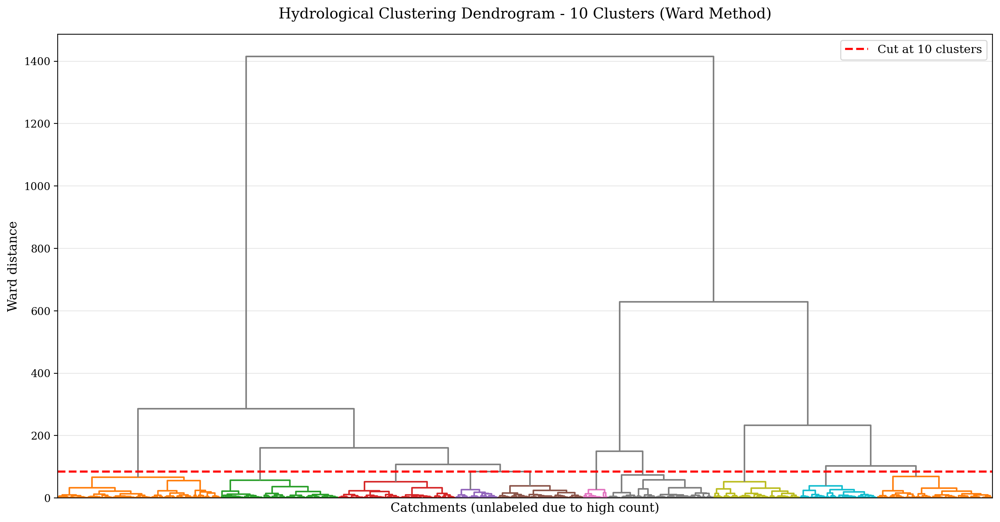

In [7]:
# Perform hierarchical clustering using Ward's method
n_hydro_clusters = 10

Z = linkage(q_df_clust.values, method="ward", metric="euclidean")

# Create dendrogram
fig, ax = plt.subplots(figsize=(16, 8))
dendro = dendrogram(
    Z,
    ax=ax,
    above_threshold_color="#808080",
    color_threshold=Z[-n_hydro_clusters + 1, 2],
    no_labels=True,
    truncate_mode="level",
    p=0,
)

ax.set_xlabel("Catchments (unlabeled due to high count)", fontsize=12)
ax.set_ylabel("Ward distance", fontsize=12)
ax.set_title(
    f"Hydrological Clustering Dendrogram - {n_hydro_clusters} Clusters (Ward Method)",
    fontsize=14,
    pad=15,
)
ax.axhline(
    y=Z[-n_hydro_clusters + 1, 2],
    color="r",
    linestyle="--",
    linewidth=2,
    label=f"Cut at {n_hydro_clusters} clusters",
)
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)


fig.savefig(
    img_dir / f"dendrogram_ward_{n_hydro_clusters}_hydro_clusters.png",
    dpi=300,
    bbox_inches="tight",
)
plt.tight_layout()
plt.show()

log.info(f"Hierarchical clustering complete: {n_hydro_clusters} clusters")


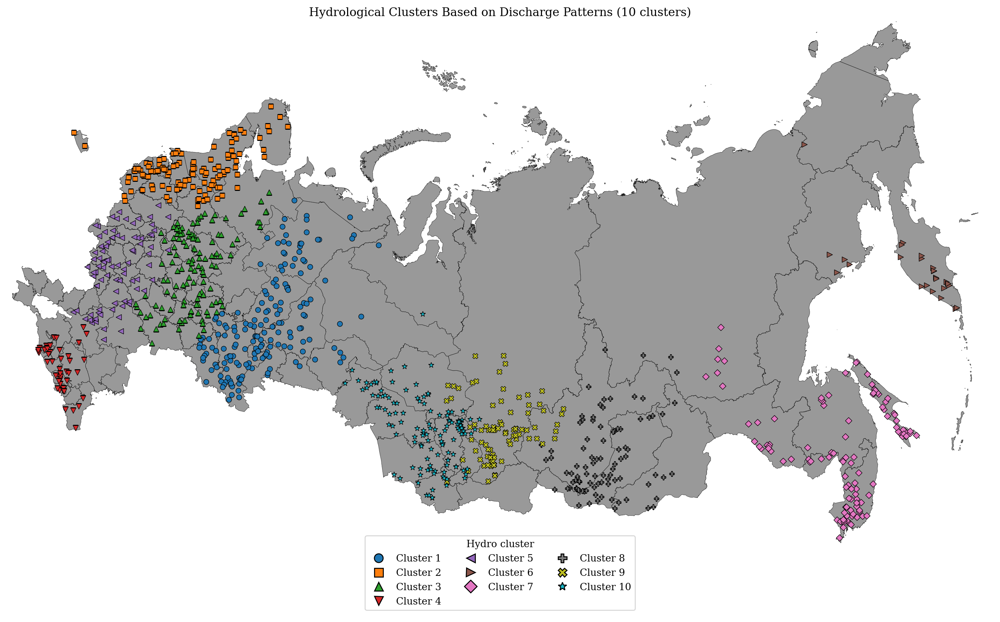

2025-11-26 12:08:27 | INFO     | PhDLogger | chapter_one | ℹ️  Saved hydrological cluster spatial map


In [11]:
# Extract cluster labels using fcluster
hydro_labels = fcluster(Z, t=n_hydro_clusters, criterion="maxclust")

# Create GeoDataFrame with cluster assignments
gauge_hydro = gauges.loc[q_df_clust.index, :].copy()
gauge_hydro["hydro_cluster_id"] = hydro_labels
gauge_hydro["Hydro cluster"] = [f"Cluster {cl}" for cl in hydro_labels]

# Get colors and markers for visualization
markers_hc = get_cluster_markers(n_hydro_clusters)
colors_hc = get_cluster_colors(n_hydro_clusters)
marker_corrections = get_marker_size_corrections()

# Plot spatial distribution of hydrological clusters
fig_hydro_map = russia_plots(
    gdf_to_plot=gauge_hydro,
    basemap_data=basemap_data,
    distinction_col="Hydro cluster",
    markers_list=markers_hc,
    color_list=colors_hc,
    marker_size_corrections=marker_corrections,
    title_text=f"Hydrological Clusters Based on Discharge Patterns ({n_hydro_clusters} clusters)",
    figsize=(16, 9),
    just_points=True,
    legend_cols=3,
    base_marker_size=28,
    base_linewidth=0.5,
)

fig_hydro_map.savefig(
    img_dir / f"hydro_clusters_{n_hydro_clusters}_map.png", dpi=300, bbox_inches="tight"
)
plt.show()

log.info("Saved hydrological cluster spatial map")


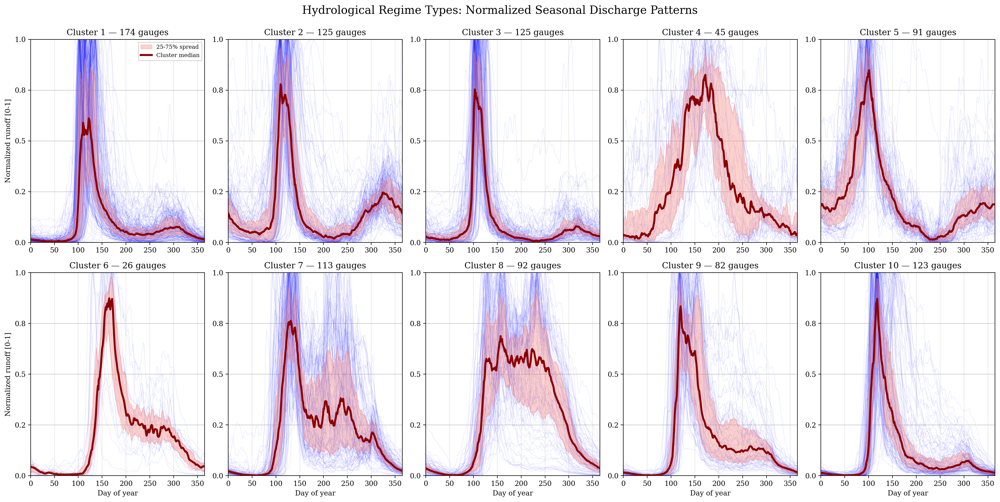

2025-11-26 11:59:06 | INFO     | PhDLogger | chapter_one | ℹ️  Hydrological regime visualization complete


In [21]:
# Prepare cluster-wise seasonal patterns
cluster_groups = list(gauge_hydro.groupby("Hydro cluster").groups.items())


def _cluster_num(key):
    """Extract numeric cluster ID from cluster name."""
    m = re.search(r"\d+", key)
    return int(m.group()) if m else float("inf")


cluster_groups_sorted = sorted(cluster_groups, key=lambda x: _cluster_num(x[0]))

# Build OrderedDict of cluster patterns
cluster_q_mm = OrderedDict()
for clust_name, member_ids in cluster_groups_sorted:
    clust_df = q_df_normalized.loc[:, member_ids].copy()
    clust_df.index = pd.date_range(start="2000-01-01", periods=366)
    cluster_q_mm[clust_name] = clust_df

# Create grid layout for 10 clusters (2 rows x 5 cols)
nrows = 2
ncols = 5

q_fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10))
axes_flat = axes.flatten()

for i, (clust_name, clust_data) in enumerate(cluster_q_mm.items()):
    if i >= len(axes_flat):
        break
    clust_ax = axes_flat[i]

    # Calculate daily statistics across all gauges in cluster
    mean_by_gauge = (
        clust_data.groupby([clust_data.index.month, clust_data.index.day])
        .median()
        .reset_index(drop=True)
    )

    # Calculate median, 25th and 75th percentiles
    clust_median = mean_by_gauge.median(axis=1).values.ravel()
    clust_p25 = mean_by_gauge.quantile(0.25, axis=1).values.ravel()
    clust_p75 = mean_by_gauge.quantile(0.75, axis=1).values.ravel()

    # LAYER 1 (BACKGROUND): Plot individual gauges (very transparent, gray-blue)
    for gauge_id in mean_by_gauge.columns:
        clust_ax.plot(
            mean_by_gauge.index.values,
            mean_by_gauge[gauge_id].values,
            color="blue",
            alpha=0.12,
            linewidth=0.5,
            zorder=1,
        )

    # LAYER 2 (MIDDLE): Plot 25-75 percentile spread (light red/salmon fill)
    clust_ax.fill_between(
        mean_by_gauge.index.values,
        clust_p25,
        clust_p75,
        color="salmon",
        alpha=0.35,
        label="25-75% spread",
        zorder=2,
    )

    # LAYER 3 (FOREGROUND): Plot cluster median (bold red line on top)
    clust_ax.plot(
        mean_by_gauge.index.values,
        clust_median,
        color="darkred",
        alpha=1.0,
        linewidth=2.8,
        label="Cluster median",
        zorder=3,
    )

    # Formatting
    clust_ax.grid(axis="both", which="both", alpha=0.3, zorder=0)
    clust_ax.set_xlim(0, 365)
    clust_ax.set_ylim(0, 1)
    clust_ax.set_yticks(np.arange(0, 1.25, 0.25))
    clust_ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

    if i % ncols == 0:
        clust_ax.set_ylabel("Normalized runoff [0-1]")
    if i >= (nrows - 1) * ncols:
        clust_ax.set_xlabel("Day of year")

    for val in np.arange(0, 1.25, 0.25):
        clust_ax.axhline(val, c="black", linestyle="--", linewidth=0.2, zorder=0)

    clust_ax.set_title(f"{clust_name} — {len(clust_data.columns)} gauges")

    # Add legend only to first subplot
    if i == 0:
        clust_ax.legend(loc="upper right", fontsize=8, framealpha=0.9)

# Turn off any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis("off")

q_fig.suptitle(
    "Hydrological Regime Types: Normalized Seasonal Discharge Patterns",
    fontsize=16,
    y=0.995,
)
q_fig.tight_layout()
q_fig.savefig(
    img_dir / f"hydrograph_clusters_{n_hydro_clusters}.png", dpi=300, bbox_inches="tight"
)
plt.show()

log.info("Hydrological regime visualization complete")


#### Cool hybrid plot

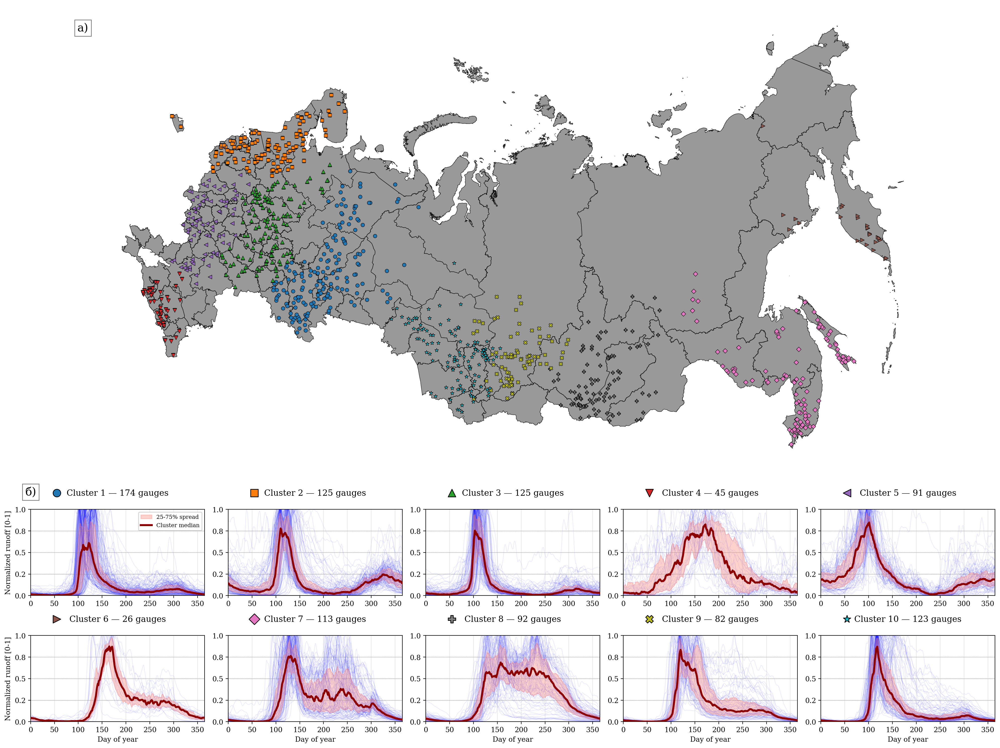

2025-11-26 11:59:11 | INFO     | PhDLogger | chapter_one | ℹ️  Combined hydrological cluster visualization saved


In [22]:
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# Create a figure
fig = plt.figure(figsize=(20, 15))

# Define the GridSpec
gs = gridspec.GridSpec(6, 5)  # n row, m columns

###############################################################################
aea_crs = ccrs.AlbersEqualArea(
    central_longitude=100,
    standard_parallels=(50, 70),
    central_latitude=56,
    false_easting=0,
    false_northing=0,
)
# to proj4 form
aea_crs_proj4 = aea_crs.proj4_init

gdf_to_plot = gauge_hydro
distinction_col = "Hydro cluster"
legend_cols = 5
base_marker_size = 28
base_linewidth = 0.5
legend_loc = "upper center"

# Create spatial clusters subplot
ax1 = plt.subplot(gs[:4, :], projection=aea_crs)
ax1.set_aspect("equal")
ax1.axis("off")

# Plot basemap
basemap_data.to_crs(aea_crs_proj4).plot(
    ax=ax1, color="grey", edgecolor="black", legend=False, alpha=0.8, linewidth=0.6
)

# Reproject data
gdf_proj = gdf_to_plot.to_crs(aea_crs_proj4)

# Get sorted categories
raw_cats = list(gdf_proj[distinction_col].astype(str).unique())
cats = sorted(
    raw_cats,
    key=lambda x: int(re.search(r"\d+", x).group())
    if re.search(r"\d+", x)
    else float("inf"),
)
n_cats = len(cats)

# Use markers and colors from the earlier russia_plots call
colors = np.array([plt.matplotlib.colors.to_rgba(c) for c in colors_hc])

# Variation tiers for repeated markers
size_variants = [1.0, 1.4, 1.8]
linewidth_variants = [1.0, 1.6, 2.2]
n_markers = len(markers_hc)

handles = []
# Plot each category with custom markers and colors
for i, cat in enumerate(cats):
    sub = gdf_proj[gdf_proj[distinction_col].astype(str) == cat]
    if sub.empty:
        continue
    xs = sub.geometry.x
    ys = sub.geometry.y

    # Choose marker and compute repetition index
    marker = markers_hc[i % n_markers]
    repeat_idx = i // n_markers
    size_factor = size_variants[repeat_idx % len(size_variants)]
    lw_factor = linewidth_variants[repeat_idx % len(linewidth_variants)]

    # Apply marker-specific size correction
    if marker in marker_corrections:
        size_factor *= marker_corrections[marker]

    # Choose color
    col = colors[i % len(colors)]

    size = int(base_marker_size * size_factor)
    linewidth = float(base_linewidth * lw_factor)

    ax1.scatter(
        xs,
        ys,
        marker=marker,
        s=size,
        c=[col],
        edgecolor="black",
        linewidth=linewidth,
        zorder=3,
    )

    # Create legend handle
    legend_size = max(4, int(0.45 * 20))
    handles.append(
        Line2D(
            [],
            [],
            marker=marker,
            color="black",
            markerfacecolor=col,
            markeredgecolor="black",
            linestyle="None",
            markersize=legend_size,
            label=str(cat),
        )
    )

draw_legend = False
# Draw legend if requested
if "draw_legend" in locals() and draw_legend and handles:
    ax1.legend(
        handles=handles,
        title=distinction_col,
        ncol=legend_cols,
        loc=legend_loc,
        frameon=True,
        fontsize=14,
    )

###############################################################################
# Time series subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4, 6) for j in range(5)]

for i, (clust_ax, (clust_name, clust_data)) in enumerate(
    zip(axs, cluster_q_mm.items(), strict=False)
):
    # Calculate daily statistics across all gauges in cluster
    mean_by_gauge = (
        clust_data.groupby([clust_data.index.month, clust_data.index.day])
        .mean()
        .reset_index(drop=True)
    )

    # Calculate median, 25th and 75th percentiles
    clust_median = mean_by_gauge.median(axis=1).values.ravel()
    clust_p25 = mean_by_gauge.quantile(0.25, axis=1).values.ravel()
    clust_p75 = mean_by_gauge.quantile(0.75, axis=1).values.ravel()

    # LAYER 1 (BACKGROUND): Plot individual gauges (very transparent, gray-blue)
    for gauge_id in mean_by_gauge.columns:
        clust_ax.plot(
            mean_by_gauge.index.values,
            mean_by_gauge[gauge_id].values,
            color="blue",
            alpha=0.12,
            linewidth=0.5,
            zorder=1,
        )

    # LAYER 2 (MIDDLE): Plot 25-75 percentile spread (light red/salmon fill)
    clust_ax.fill_between(
        mean_by_gauge.index.values,
        clust_p25,
        clust_p75,
        color="salmon",
        alpha=0.35,
        label="25-75% spread",
        zorder=2,
    )

    # LAYER 3 (FOREGROUND): Plot cluster median (bold red line on top)
    clust_ax.plot(
        mean_by_gauge.index.values,
        clust_median,
        color="darkred",
        alpha=1.0,
        linewidth=2.8,
        label="Cluster median",
        zorder=3,
    )

    # Formatting
    clust_ax.grid(axis="both", which="both", alpha=0.3, zorder=0)
    clust_ax.set_xlim(0, 365)
    clust_ax.set_ylim(0, 1)
    clust_ax.set_yticks(np.arange(0, 1.25, 0.25))
    clust_ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

    if i % ncols == 0:
        clust_ax.set_ylabel("Normalized runoff [0-1]")
    if i >= (nrows - 1) * ncols:
        clust_ax.set_xlabel("Day of year")

    for val in np.arange(0, 1.25, 0.25):
        clust_ax.axhline(val, c="black", linestyle="--", linewidth=0.2, zorder=0)
    # Get marker symbol and color for this cluster
    cluster_marker = markers_hc[i % len(markers_hc)]
    cluster_color = colors_hc[i % len(colors_hc)]

    # Create title with rendered marker symbol using scatter plot
    # Position marker in title area using text coordinates
    title_text = f"{clust_name} — {len(clust_data.columns)} gauges"
    clust_ax.set_title(title_text, pad=20)

    # Add marker symbol to the left of the title
    # Use axis coordinates: (0, 1) is top-left corner
    clust_ax.scatter(
        0.15,
        1.19,
        marker=cluster_marker,
        s=120,
        c=[cluster_color],
        edgecolor="black",
        linewidth=1.0,
        transform=clust_ax.transAxes,
        clip_on=False,
        zorder=10,
    )

    # Add legend only to first subplot
    if i == 0:
        clust_ax.legend(loc="upper right", fontsize=8, framealpha=0.9)

ax1.text(
    0.0,
    0.95,
    "а)",
    transform=ax1.transAxes,
    fontsize=16,
    va="center",
    ha="center",
    bbox=dict(facecolor="white", alpha=0.5),
)
axs[0].text(
    0.0,
    1.2,
    "б)",
    transform=axs[0].transAxes,
    fontsize=16,
    va="center",
    ha="center",
    bbox=dict(facecolor="white", alpha=0.5),
)
# Adjust layout
plt.tight_layout()
plt.show()

fig.savefig(
    img_dir / f"hydro_clusters_combined_{n_hydro_clusters}.png",
    dpi=300,
    bbox_inches="tight",
)

log.info("Combined hydrological cluster visualization saved")


## 1. DOY-Based Peak Timing Extraction

Extract hydrological regime characteristics from cluster_q_mm using day-of-year patterns.

In [32]:
# Verify cluster_q_mm exists from previous cells
if "cluster_q_mm" not in locals():
    raise RuntimeError("cluster_q_mm not found. Run NewChapterOne.ipynb cells first.")

# Initialize storage for regime characteristics
hydro_regime_info = OrderedDict()

# Define seasonal DOY ranges (1-based indexing)
# Winter: Dec 1 - Feb 28/29 (DOY 335-365, 1-59)
# Spring: Mar 1 - May 31 (DOY 60-151)
# Summer: Jun 1 - Aug 31 (DOY 152-243)
# Autumn: Sep 1 - Nov 30 (DOY 244-334)

for clust_name, clust_df in cluster_q_mm.items():
    # Compute cluster median pattern (366 days)
    cluster_median = clust_df.median(axis=1).values

    # Find peak DOY (1-366)
    peak_doy = int(np.argmax(cluster_median)) + 1  # Convert 0-indexed to 1-indexed
    peak_value = float(cluster_median[peak_doy - 1])

    # Calculate seasonal ratios
    # Winter: DOY 335-365 + 1-59
    winter_indices = list(range(334, 365)) + list(range(59))
    winter_mean = float(cluster_median[winter_indices].mean())

    # Spring: DOY 60-151
    spring_mean = float(cluster_median[59:151].mean())

    # Summer: DOY 152-243
    summer_mean = float(cluster_median[151:243].mean())

    # Autumn: DOY 244-334
    autumn_mean = float(cluster_median[243:334].mean())

    # Total for normalization
    total_seasonal = winter_mean + spring_mean + summer_mean + autumn_mean

    # Normalized ratios
    winter_ratio = winter_mean / total_seasonal if total_seasonal > 0 else 0.0
    spring_ratio = spring_mean / total_seasonal if total_seasonal > 0 else 0.0
    summer_ratio = summer_mean / total_seasonal if total_seasonal > 0 else 0.0
    autumn_ratio = autumn_mean / total_seasonal if total_seasonal > 0 else 0.0

    # Classify regime type in Russian based on peak timing and ratios
    if 60 <= peak_doy <= 151:  # Spring peak
        if spring_ratio > 0.40:
            regime_type = "Весеннее половодье"  # Spring flood-dominated
        else:
            regime_type = "Весенне-летний"  # Spring-summer
    elif 152 <= peak_doy <= 243:  # Summer peak
        if summer_ratio > 0.35:
            regime_type = "Летнее половодье"  # Summer flood-dominated (glacier/snow)
        else:
            regime_type = "Летне-осенний"  # Summer-autumn
    elif 244 <= peak_doy <= 334:  # Autumn peak
        regime_type = "Осенне-зимний"  # Autumn-winter (rainfall-dominated)
    else:  # Winter peak (rare, indicates groundwater or regulated flow)
        regime_type = "Зимний (межень)"  # Winter low-flow

    # Additional regime refinement based on variability
    cv = (
        float(cluster_median.std() / cluster_median.mean())
        if cluster_median.mean() > 0
        else 0.0
    )
    if cv < 0.3:
        regime_type += " (маловодный)"  # Low variability
    elif cv > 0.7:
        regime_type += " (паводочный)"  # High variability/flashy

    # Store results
    hydro_regime_info[clust_name] = {
        "peak_doy": peak_doy,
        "peak_value": peak_value,
        "winter_ratio": winter_ratio,
        "spring_ratio": spring_ratio,
        "summer_ratio": summer_ratio,
        "autumn_ratio": autumn_ratio,
        "regime_type": regime_type,
        "cv": cv,
        "n_gauges": len(clust_df.columns),
    }

# Convert to DataFrame for display
regime_df = pd.DataFrame.from_dict(hydro_regime_info, orient="index")
regime_df.index.name = "cluster_name"
regime_df.reset_index(inplace=True)

log.info(f"Extracted regime info for {len(regime_df)} hydrological clusters")
print("\nHydrological Regime Characteristics:")
print("=" * 80)
for _, row in regime_df.iterrows():
    print(f"\n{row['cluster_name']} (n={row['n_gauges']}):")
    print(f"  Peak DOY: {row['peak_doy']} (value={row['peak_value']:.3f})")
    print(f"  Regime: {row['regime_type']}")
    print(
        f"  Seasonal ratios - Winter:{row['winter_ratio']:.2f} | "
        f"Spring:{row['spring_ratio']:.2f} | "
        f"Summer:{row['summer_ratio']:.2f} | "
        f"Autumn:{row['autumn_ratio']:.2f}"
    )
    print(f"  CV: {row['cv']:.3f}")

regime_df


2025-11-26 12:06:07 | INFO     | PhDLogger | chapter_one | ℹ️  Extracted regime info for 10 hydrological clusters



Hydrological Regime Characteristics:

Cluster 1 (n=174):
  Peak DOY: 123 (value=0.611)
  Regime: Весеннее половодье (паводочный)
  Seasonal ratios - Winter:0.04 | Spring:0.62 | Summer:0.19 | Autumn:0.15
  CV: 1.471

Cluster 2 (n=125):
  Peak DOY: 111 (value=0.779)
  Regime: Весеннее половодье (паводочный)
  Seasonal ratios - Winter:0.19 | Spring:0.51 | Summer:0.08 | Autumn:0.22
  CV: 1.106

Cluster 3 (n=125):
  Peak DOY: 104 (value=0.754)
  Regime: Весеннее половодье (паводочный)
  Seasonal ratios - Winter:0.07 | Spring:0.72 | Summer:0.08 | Autumn:0.13
  CV: 1.797

Cluster 4 (n=45):
  Peak DOY: 173 (value=0.826)
  Regime: Летнее половодье (паводочный)
  Seasonal ratios - Winter:0.04 | Spring:0.33 | Summer:0.49 | Autumn:0.14
  CV: 0.883

Cluster 5 (n=91):
  Peak DOY: 102 (value=0.849)
  Regime: Весеннее половодье (паводочный)
  Seasonal ratios - Winter:0.22 | Spring:0.57 | Summer:0.09 | Autumn:0.11
  CV: 0.903

Cluster 6 (n=26):
  Peak DOY: 166 (value=0.874)
  Regime: Летнее половодье 

,cluster_name,peak_doy,peak_value,winter_ratio,spring_ratio,summer_ratio,autumn_ratio,regime_type,cv,n_gauges
0,Cluster 1,123,0.610829,0.036447,0.623329,0.188247,0.151977,Весеннее половодье (паводочный),1.470845,174
1,Cluster 2,111,0.778859,0.185105,0.512609,0.081498,0.220788,Весеннее половодье (паводочный),1.105821,125
2,Cluster 3,104,0.753647,0.074948,0.721555,0.077037,0.126460,Весеннее половодье (паводочный),1.797047,125
3,Cluster 4,173,0.825626,0.039326,0.331580,0.493810,0.135284,Летнее половодье (паводочный),0.882858,45
4,Cluster 5,102,0.848509,0.219426,0.573396,0.094227,0.112950,Весеннее половодье (паводочный),0.902980,91
5,Cluster 6,166,0.873613,0.040625,0.131495,0.585388,0.242492,Летнее половодье (паводочный),1.103826,26
6,Cluster 7,132,0.762953,0.025525,0.369550,0.368026,0.236899,Весенне-летний (паводочный),0.932015,113
7,Cluster 8,158,0.687620,0.026126,0.193094,0.511804,0.268976,Летнее половодье (паводочный),0.855520,92
8,Cluster 9,121,0.834308,0.023102,0.477027,0.330799,0.169072,Весеннее половодье (паводочный),1.228615,82
9,Cluster 10,119,0.870940,0.025180,0.646746,0.221521,0.106554,Весеннее половодье (паводочный),1.598268,123


## 2. Gauge-Level Cluster Mapping with Russian Naming

Merge geographical and hydrological cluster assignments and apply Russian naming convention.

In [ ]:
"""Build gauge-level cluster mapping with Ф#-Г# naming and consolidation."""

# Verify required data structures
if "geo_cluster_info" not in locals():
    raise RuntimeError("geo_cluster_info not found. Run previous cells first.")
if "gauge_hydro" not in locals():
    raise RuntimeError("gauge_hydro not found. Run previous cells first.")

# Start with gauge_hydro (has hydro cluster assignments)
gauge_mapping = gauge_hydro[["hydro_cluster_id"]].copy()

# Add geographical cluster info via merge on index
gauge_mapping = gauge_mapping.join(geo_cluster_info, how="left")

# Fill any missing geo cluster assignments
gauge_mapping["geo_cluster_id"] = gauge_mapping["geo_cluster_id"].fillna(-1).astype(int)
gauge_mapping["geo_cluster_name"] = gauge_mapping["geo_cluster_name"].fillna("Unknown")


# Apply Russian naming convention
def format_geo_cluster_ru(cluster_id: int) -> str:
    """Format geo cluster ID as Ф# (Russian)."""
    return "Ф?" if cluster_id <= 0 else f"Ф{cluster_id}"


def format_hydro_cluster_ru(cluster_id: int) -> str:
    """Format hydro cluster ID as Г# (Russian)."""
    return f"Г{cluster_id}"


gauge_mapping["geo_cluster_ru"] = gauge_mapping["geo_cluster_id"].apply(
    format_geo_cluster_ru
)
gauge_mapping["hydro_cluster_ru"] = gauge_mapping["hydro_cluster_id"].apply(
    format_hydro_cluster_ru
)

# Create RAW hybrid combo Ф#-Г# (before consolidation)
gauge_mapping["hybrid_combo"] = (
    gauge_mapping["geo_cluster_ru"] + "-" + gauge_mapping["hydro_cluster_ru"]
)

# Reset index to make gauge_id a column
gauge_mapping = gauge_mapping.reset_index().rename(columns={"index": "gauge_id"})

log.info(f"Created gauge-level mapping for {len(gauge_mapping)} gauges")
print("\nGauge-Level Cluster Mapping (RAW combinations):")
print(f"Total gauges: {len(gauge_mapping)}")
print(f"Unique geo clusters: {gauge_mapping['geo_cluster_ru'].nunique()}")
print(f"Unique hydro clusters: {gauge_mapping['hydro_cluster_ru'].nunique()}")
print(
    f"Raw hybrid combinations: {gauge_mapping['hybrid_combo'].nunique()} (before consolidation)"
)

# === CONSOLIDATION STEP ===
combo_counts = gauge_mapping["hybrid_combo"].value_counts()
target_n_classes = 16
min_gauges_per_class = 5

print("\nConsolidation parameters:")
print(f"  Target classes: {target_n_classes}")
print(f"  Min gauges per class: {min_gauges_per_class}")

# Identify rare vs common combinations
rare_combos = combo_counts[combo_counts < min_gauges_per_class].index.tolist()
common_combos = combo_counts[combo_counts >= min_gauges_per_class].index.tolist()

print(f"  Rare combinations (< {min_gauges_per_class} gauges): {len(rare_combos)}")
print(f"  Common combinations: {len(common_combos)}")

# Keep top N combinations, merge the rest
if len(common_combos) > target_n_classes:
    top_combos = combo_counts.head(target_n_classes).index.tolist()
    merge_combos = [c for c in combo_counts.index if c not in top_combos]
    print(
        f"  Keeping top {target_n_classes} combinations, merging {len(merge_combos)} others"
    )
else:
    top_combos = common_combos
    merge_combos = rare_combos
    print(f"  Keeping {len(common_combos)} common, merging {len(rare_combos)} rare")

# Create mapping: rare combos → "Ф#-Mixed"
hybrid_class_map = {combo: combo for combo in top_combos}
for combo in merge_combos:
    geo_part = combo.split("-")[0]
    hybrid_class_map[combo] = f"{geo_part}-Mixed"

# Apply consolidation
gauge_mapping["hybrid_class"] = gauge_mapping["hybrid_combo"].map(hybrid_class_map)

# Report results
final_class_counts = gauge_mapping["hybrid_class"].value_counts()
print("\n✓ Consolidation complete")
print(f"  Final hybrid classes: {len(final_class_counts)}")
print(
    f"  Gauges per class (mean): {final_class_counts.mean():.1f}, (median): {final_class_counts.median():.0f}"
)
print(f"  Min gauges: {final_class_counts.min()}, Max gauges: {final_class_counts.max()}")

print("\nFinal class distribution:")
print(final_class_counts.sort_values(ascending=False))

gauge_mapping.head(10)


2025-11-26 12:10:22 | INFO     | PhDLogger | chapter_one | ℹ️  Created gauge-level mapping for 996 gauges



Gauge-Level Cluster Mapping (RAW combinations):
Total gauges: 996
Unique geo clusters: 9
Unique hydro clusters: 10
Raw hybrid combinations: 51 (before consolidation)

Consolidation parameters:
  Target classes: 16
  Min gauges per class: 5
  Rare combinations (< 5 gauges): 17
  Common combinations: 34
  Keeping top 16 combinations, merging 35 others

✓ Consolidation complete
  Final hybrid classes: 25
  Gauges per class (mean): 39.8, (median): 43
  Min gauges: 1, Max gauges: 68

Final class distribution:
hybrid_class
Ф1-Г5       68
Ф5-Г3       66
Ф9-Г7       64
Ф9-Mixed    52
Ф1-Г1       52
Ф1-Г3       52
Ф4-Г2       50
Ф3-Г8       50
Ф5-Mixed    49
Ф3-Mixed    45
Ф9-Г9       44
Ф5-Г2       43
Ф8-Г1       43
Ф5-Г1       39
Ф5-Г10      37
Ф1-Mixed    34
Ф6-Mixed    34
Ф9-Г1       33
Ф7-Mixed    30
Ф8-Г10      30
Ф6-Г2       27
Ф2-Г4       27
Ф8-Mixed    25
Ф4-Mixed     1
Ф2-Mixed     1
Name: count, dtype: int64


,gauge_id,hydro_cluster_id,geo_cluster_id,geo_cluster_name,geo_cluster_ru,hydro_cluster_ru,hybrid_combo,hybrid_class
0,70158,3,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г3,Ф5-Г3,Ф5-Г3
1,8290,9,9,Heavily Forested (90.0%),Ф9,Г9,Ф9-Г9,Ф9-Г9
2,70583,3,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г3,Ф5-Г3,Ф5-Г3
3,76408,1,9,Heavily Forested (90.0%),Ф9,Г1,Ф9-Г1,Ф9-Г1
4,72668,2,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г2,Ф5-Г2,Ф5-Г2
5,77112,3,1,Clay-rich (19.4%),Ф1,Г3,Ф1-Г3,Ф1-Г3
6,72327,2,6,Karst (93.6%) / Heavily Forested,Ф6,Г2,Ф6-Г2,Ф6-Г2
7,11352,10,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г10,Ф5-Г10,Ф5-Г10
8,8256,9,9,Heavily Forested (90.0%),Ф9,Г9,Ф9-Г9,Ф9-Г9
9,78519,5,1,Clay-rich (19.4%),Ф1,Г5,Ф1-Г5,Ф1-Г5


## 3. Hex Grid Assignment for Spatial Analysis

Create hexagonal grid and assign hex_id to each gauge via spatial join.

In [15]:
# Verify gauges GeoDataFrame exists
if "gauges" not in locals():
    raise RuntimeError("gauges GeoDataFrame not found.")


def create_hexagonal_grid(bounds, hex_size_km=100):
    """Create hexagonal grid covering the bounding box.

    Args:
        bounds: (minx, miny, maxx, maxy) in geographic coordinates
        hex_size_km: Approximate hex diameter in km

    Returns:
        GeoDataFrame with hexagonal polygons and hex_id
    """
    from shapely.geometry import Polygon

    minx, miny, maxx, maxy = bounds

    # Convert km to degrees (rough approximation at 60°N)
    # 1 degree lat ≈ 111 km, 1 degree lon ≈ 55.5 km at 60°N
    hex_size_deg_lat = hex_size_km / 111.0
    hex_size_deg_lon = hex_size_km / 55.5

    # Use average for simplicity
    hex_size = (hex_size_deg_lat + hex_size_deg_lon) / 2

    # Hex geometry
    hex_width = hex_size
    hex_height = hex_size * np.sqrt(3) / 2

    hexagons = []
    hex_ids = []
    hex_counter = 0

    # Generate hex grid
    y = miny
    row = 0
    while y < maxy:
        x_offset = (hex_width * 0.75) * (row % 2)  # Offset every other row
        x = minx + x_offset

        while x < maxx:
            # Create hexagon centered at (x, y)
            hex_coords = []
            for i in range(6):
                angle_deg = 60 * i
                angle_rad = np.radians(angle_deg)
                hx = x + hex_width / 2 * np.cos(angle_rad)
                hy = y + hex_height / 2 * np.sin(angle_rad)
                hex_coords.append((hx, hy))

            hexagons.append(Polygon(hex_coords))
            hex_ids.append(f"H{hex_counter:04d}")
            hex_counter += 1

            x += hex_width * 1.5

        y += hex_height
        row += 1

    hex_gdf = gpd.GeoDataFrame(
        {"hex_id": hex_ids},
        geometry=hexagons,
        crs="EPSG:4326",  # WGS84
    )

    return hex_gdf


# Get bounds from gauges
bounds = gauges.total_bounds  # (minx, miny, maxx, maxy)

# Create hex grid (100km cells)
hex_grid = create_hexagonal_grid(bounds, hex_size_km=100)

log.info(f"Created hexagonal grid with {len(hex_grid)} cells")
print(f"\nHexagonal grid: {len(hex_grid)} cells")
print(f"Bounds: {bounds}")

# Spatial join: assign hex_id to each gauge
# Use 'within' predicate for direct containment
gauge_hex_join = gpd.sjoin(
    gauges[["geometry"]].copy(), hex_grid, how="left", predicate="within"
)

# For gauges not within any hex (edge cases), use nearest hex
missing_hex_mask = gauge_hex_join["hex_id"].isna()
n_missing = missing_hex_mask.sum()

if n_missing > 0:
    log.warning(f"{n_missing} gauges not within hex grid, using nearest hex")
    print(f"\nWarning: {n_missing} gauges outside hex grid, assigning nearest hex...")

    # Use nearest join for missing gauges
    missing_gauges = gauges.loc[missing_hex_mask, ["geometry"]].copy()
    nearest_join = gpd.sjoin_nearest(missing_gauges, hex_grid, how="left")

    # Fill in missing hex_id values
    gauge_hex_join.loc[missing_hex_mask, "hex_id"] = nearest_join["hex_id"].values

# Extract hex_id column
gauge_mapping["hex_id"] = gauge_hex_join.loc[gauge_mapping["gauge_id"], "hex_id"].values

log.info(f"Assigned hex_id to {len(gauge_mapping)} gauges")
print("\n✓ Hex assignment complete")
print(f"Unique hexes with gauges: {gauge_mapping['hex_id'].nunique()}")
print(
    f"Gauges per hex (mean): {len(gauge_mapping) / gauge_mapping['hex_id'].nunique():.1f}"
)

gauge_mapping.head(10)

2025-11-26 12:11:06 | INFO     | PhDLogger | chapter_one | ℹ️  Created hexagonal grid with 1680 cells
2025-11-26 12:11:06 | WARNING  | PhDLogger | chapter_one | ⚠️  558 gauges not within hex grid, using nearest hex
/Users/dmbrmv/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/array.py:408: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(
2025-11-26 12:11:06 | INFO     | PhDLogger | chapter_one | ℹ️  Assigned hex_id to 996 gauges



Hexagonal grid: 1680 cells
Bounds: [ 19.9222878   41.66475075 161.17462     68.88583   ]


✓ Hex assignment complete
Unique hexes with gauges: 389
Gauges per hex (mean): 2.6


,gauge_id,hydro_cluster_id,geo_cluster_id,geo_cluster_name,geo_cluster_ru,hydro_cluster_ru,hybrid_combo,hybrid_class,hex_id
0,70158,3,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г3,Ф5-Г3,Ф5-Г3,H1133
1,8290,9,9,Heavily Forested (90.0%),Ф9,Г9,Ф9-Г9,Ф9-Г9,H1018
2,70583,3,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г3,Ф5-Г3,Ф5-Г3,H1059
3,76408,1,9,Heavily Forested (90.0%),Ф9,Г1,Ф9-Г1,Ф9-Г1,H0789
4,72668,2,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г2,Ф5-Г2,Ф5-Г2,H0914
5,77112,3,1,Clay-rich (19.4%),Ф1,Г3,Ф1-Г3,Ф1-Г3,H0854
6,72327,2,6,Karst (93.6%) / Heavily Forested,Ф6,Г2,Ф6-Г2,Ф6-Г2,H0987
7,11352,10,5,Wetland (11.2) / Semi-arid (0mm/yr),Ф5,Г10,Ф5-Г10,Ф5-Г10,H0937
8,8256,9,9,Heavily Forested (90.0%),Ф9,Г9,Ф9-Г9,Ф9-Г9,H0950
9,78519,5,1,Clay-rich (19.4%),Ф1,Г5,Ф1-Г5,Ф1-Г5,H0430


## 4. Export Gauge Cluster Mapping CSV

Export the comprehensive gauge-level mapping file.

In [16]:
"""Export gauge cluster mapping to CSV."""

# Create output directory
output_dir = Path("../data/cluster_references")
output_dir.mkdir(parents=True, exist_ok=True)

# Prepare export DataFrame
export_cols = [
    "gauge_id",
    "geo_cluster_id",
    "geo_cluster_ru",
    "geo_cluster_name",
    "hydro_cluster_id",
    "hydro_cluster_ru",
    "hybrid_class",
    "hex_id",
]

gauge_export = gauge_mapping[export_cols].copy()

# Sort by gauge_id for consistency
gauge_export.sort_values("gauge_id", inplace=True)

# Export to CSV
output_path = output_dir / "gauge_cluster_mapping.csv"
gauge_export.to_csv(output_path, index=False, encoding="utf-8")

log.info(f"Exported gauge mapping to {output_path}")
print("\n✓ Exported gauge cluster mapping")
print(f"File: {output_path}")
print(f"Rows: {len(gauge_export)}")
print(f"Columns: {list(gauge_export.columns)}")

print("\nSample records:")
print(gauge_export.head(10).to_string(index=False))

2025-11-26 12:11:09 | INFO     | PhDLogger | chapter_one | ℹ️  Exported gauge mapping to ../data/cluster_references/gauge_cluster_mapping.csv



✓ Exported gauge cluster mapping
File: ../data/cluster_references/gauge_cluster_mapping.csv
Rows: 996
Columns: ['gauge_id', 'geo_cluster_id', 'geo_cluster_ru', 'geo_cluster_name', 'hydro_cluster_id', 'hydro_cluster_ru', 'hybrid_class', 'hex_id']

Sample records:
gauge_id  geo_cluster_id geo_cluster_ru                     geo_cluster_name  hydro_cluster_id hydro_cluster_ru hybrid_class hex_id
   10042               3             Ф3 Hilly (12.9) / Mid-elevation (1166m)                10              Г10     Ф3-Mixed  H0663
   10044               3             Ф3 Hilly (12.9) / Mid-elevation (1166m)                10              Г10     Ф3-Mixed  H0663
   10048               9             Ф9             Heavily Forested (90.0%)                10              Г10     Ф9-Mixed  H0662
   10058               9             Ф9             Heavily Forested (90.0%)                10              Г10     Ф9-Mixed  H0663
   10059               3             Ф3 Hilly (12.9) / Mid-elevation (1166m)

## 5. Generate YAML Reference Files

Create YAML documentation for geographical, hydrological, and hybrid clusters with Russian names.

In [17]:
"""Generate YAML reference files for cluster documentation."""
from collections import OrderedDict
from pathlib import Path

import yaml

# Create output directory
docs_dir = Path("../docs/cluster_references")
docs_dir.mkdir(parents=True, exist_ok=True)

# ============================================================================
# 1. GEO CLUSTERS (Ф1-Ф9)
# ============================================================================

# Verify russian_names dict exists
if "russian_names" not in locals():
    # Fallback minimal dict
    russian_names = {
        "for_pc_use": "Лесистость",
        "crp_pc_use": "Пахотные земли",
        "prm_pc_use": "Мерзлотные территории",
        "kar_pc_use": "Карстовые породы",
        "urb_pc_use": "Урбанизированные территории",
        "lka_pc_use": "Озерность",
        "slp_dg_uav": "Средний уклон водосбора",
        "ele_mt_uav": "Средняя высота водосбора",
        "ws_area": "Площадь водосбора",
    }

geo_clusters_yaml = OrderedDict()

if "cluster_centroids_raw" in locals() and "cluster_names" in locals():
    for cid in range(1, cluster_number + 1):
        cluster_key = f"Ф{cid}"

        # Get top 5 features by normalized value
        centroid_norm = cluster_centroids.loc[cid, available_features]
        top_features = centroid_norm.nlargest(5)

        dominant_chars = OrderedDict()
        for feat, val in top_features.items():
            raw_val = cluster_centroids_raw.loc[cid, feat]
            feat_ru = russian_names.get(feat, feat)
            dominant_chars[feat_ru] = {"value": float(raw_val), "normalized": float(val)}

        n_gauges = int((hierarchical_labels == cid).sum())

        geo_clusters_yaml[cluster_key] = OrderedDict(
            [
                ("id", cid),
                ("name_ru", cluster_names[cid]),
                ("n_gauges", n_gauges),
                ("dominant_characteristics", dominant_chars),
            ]
        )
else:
    log.warning("cluster_centroids_raw or cluster_names not found")
    # Create placeholder
    for cid in range(1, 10):
        geo_clusters_yaml[f"Ф{cid}"] = {
            "id": cid,
            "name_ru": f"Кластер {cid}",
            "n_gauges": 0,
        }

# Write geo clusters YAML
geo_yaml_path = docs_dir / "geo_clusters_ru.yaml"
with open(geo_yaml_path, "w", encoding="utf-8") as f:
    yaml.dump(
        dict(geo_clusters_yaml),
        f,
        allow_unicode=True,
        default_flow_style=False,
        sort_keys=False,
    )

log.info(f"Exported geo clusters YAML to {geo_yaml_path}")

# ============================================================================
# 2. HYDRO CLUSTERS (Г1-Г10)
# ============================================================================

hydro_clusters_yaml = OrderedDict()

if "hydro_regime_info" in locals():
    for clust_name, info in hydro_regime_info.items():
        # Extract cluster number from "Cluster N"
        import re

        match = re.search(r"\d+", clust_name)
        if not match:
            continue
        cid = int(match.group())

        cluster_key = f"Г{cid}"

        hydro_clusters_yaml[cluster_key] = OrderedDict(
            [
                ("id", cid),
                ("regime_type", info["regime_type"]),
                ("peak_doy", info["peak_doy"]),
                ("peak_value", round(info["peak_value"], 3)),
                (
                    "seasonal_ratios",
                    OrderedDict(
                        [
                            ("winter", round(info["winter_ratio"], 3)),
                            ("spring", round(info["spring_ratio"], 3)),
                            ("summer", round(info["summer_ratio"], 3)),
                            ("autumn", round(info["autumn_ratio"], 3)),
                        ]
                    ),
                ),
                ("cv", round(info["cv"], 3)),
                ("n_gauges", info["n_gauges"]),
            ]
        )
else:
    log.warning("hydro_regime_info not found")
    # Create placeholder
    for cid in range(1, 11):
        hydro_clusters_yaml[f"Г{cid}"] = {
            "id": cid,
            "regime_type": "Неизвестно",
            "n_gauges": 0,
        }

# Write hydro clusters YAML
hydro_yaml_path = docs_dir / "hydro_clusters_ru.yaml"
with open(hydro_yaml_path, "w", encoding="utf-8") as f:
    yaml.dump(
        dict(hydro_clusters_yaml),
        f,
        allow_unicode=True,
        default_flow_style=False,
        sort_keys=False,
    )

log.info(f"Exported hydro clusters YAML to {hydro_yaml_path}")

# ============================================================================
# 3. HYBRID CLUSTERS (Ф#-Г#)
# ============================================================================

hybrid_clusters_yaml = OrderedDict()

# Get unique hybrid classes from gauge_mapping
hybrid_counts = gauge_mapping["hybrid_class"].value_counts()

for hybrid_class, count in hybrid_counts.items():
    # Parse Ф#-Г#
    parts = hybrid_class.split("-")
    if len(parts) != 2:
        continue

    geo_key, hydro_key = parts

    # Get descriptions from individual cluster YAMLs
    geo_desc = geo_clusters_yaml.get(geo_key, {}).get("name_ru", "Неизвестно")
    hydro_desc = hydro_clusters_yaml.get(hydro_key, {}).get("regime_type", "Неизвестно")

    hybrid_clusters_yaml[hybrid_class] = OrderedDict(
        [
            ("geo_cluster", geo_key),
            ("hydro_cluster", hydro_key),
            ("geo_description", geo_desc),
            ("hydro_description", hydro_desc),
            ("n_gauges", int(count)),
        ]
    )

# Write hybrid clusters YAML
hybrid_yaml_path = docs_dir / "hybrid_clusters_ru.yaml"
with open(hybrid_yaml_path, "w", encoding="utf-8") as f:
    yaml.dump(
        dict(hybrid_clusters_yaml),
        f,
        allow_unicode=True,
        default_flow_style=False,
        sort_keys=False,
    )

log.info(f"Exported hybrid clusters YAML to {hybrid_yaml_path}")

# ============================================================================
# 4. README
# ============================================================================

readme_content = """# Cluster References (Русский)

## Overview

This directory contains YAML reference files for the cluster-based hydrological classification system used in the dissertation.

### Files

1. **geo_clusters_ru.yaml** — Geographical clusters (Ф1-Ф9)
   - Based on HydroATLAS physiographic attributes
   - Ward hierarchical clustering
   - Includes dominant physical characteristics

2. **hydro_clusters_ru.yaml** — Hydrological clusters (Г1-Г10)
   - Based on normalized seasonal discharge patterns
   - DOY-based peak timing extraction
   - Seasonal ratio classification

3. **hybrid_clusters_ru.yaml** — Hybrid classifications (Ф#-Г#)
   - Cross-product of geo and hydro clusters
   - Gauge counts per hybrid class

### Naming Convention

- **Ф#** (Фи) — Физико-географический кластер (Geo cluster)
- **Г#** (Ге) — Гидрологический кластер (Hydro cluster)
- **Ф#-Г#** — Hybrid class combining both dimensions

### Methodology

**Geographical Clustering:**
- Features: 19 HydroATLAS attributes (land cover, soil, topography, etc.)
- Method: Ward hierarchical clustering on normalized features
- Validation: Silhouette score, Calinski-Harabasz, Davies-Bouldin

**Hydrological Clustering:**
- Features: 366-day normalized discharge patterns + coordinates
- Method: Ward hierarchical clustering on seasonal cycles
- Peak timing: Extracted via np.argmax() on median cluster pattern
- Seasonal ratios: Winter (DOY 335-59), Spring (60-151), Summer (152-243), Autumn (244-334)
- Regime types: Classified in Russian based on peak DOY and seasonal dominance

**Hex Grid Assignment:**
- Grid: 100km hexagonal cells covering study region
- Assignment: Spatial join (within predicate) with k-nearest fallback
- Purpose: Enables spatial aggregation and regional analysis

### Usage

```python
import yaml

# Load geo clusters
with open('geo_clusters_ru.yaml', 'r', encoding='utf-8') as f:
    geo_clusters = yaml.safe_load(f)

# Access specific cluster
cluster_f1 = geo_clusters['Ф1']
print(cluster_f1['name_ru'])  # Russian name
print(cluster_f1['n_gauges'])  # Number of gauges
```

### Data Files

The gauge-level mapping CSV is located at:
```
data/cluster_references/gauge_cluster_mapping.csv
```

Columns:
- `gauge_id` — Primary key (string)
- `geo_cluster_id` — Numeric geo cluster (1-9)
- `geo_cluster_ru` — Russian geo label (Ф1-Ф9)
- `geo_cluster_name` — English description
- `hydro_cluster_id` — Numeric hydro cluster (1-10)
- `hydro_cluster_ru` — Russian hydro label (Г1-Г10)
- `hybrid_class` — Combined Ф#-Г# identifier
- `hex_id` — Spatial hex cell ID (H####)

### Generated

Auto-generated from `notebooks/NewChapterOneUpdate.ipynb`

Date: {date}
"""

from datetime import datetime

readme_path = docs_dir / "README.md"
with open(readme_path, "w", encoding="utf-8") as f:
    f.write(readme_content.format(date=datetime.now().strftime("%Y-%m-%d")))

log.info(f"Exported README to {readme_path}")

# ============================================================================
# Summary
# ============================================================================

print("\n" + "=" * 80)
print("✓ YAML REFERENCE FILES GENERATED")
print("=" * 80)
print(f"\nOutput directory: {docs_dir}")
print("\nFiles created:")
print(f"  1. geo_clusters_ru.yaml ({len(geo_clusters_yaml)} clusters)")
print(f"  2. hydro_clusters_ru.yaml ({len(hydro_clusters_yaml)} clusters)")
print(f"  3. hybrid_clusters_ru.yaml ({len(hybrid_clusters_yaml)} combinations)")
print("  4. README.md (methodology documentation)")

print(f"\nTotal hybrid classes: {len(hybrid_clusters_yaml)}")
print(f"Total gauges mapped: {len(gauge_mapping)}")

print("\n" + "=" * 80)

2025-11-26 12:11:11 | WARNING  | PhDLogger | chapter_one | ⚠️  cluster_centroids_raw or cluster_names not found
2025-11-26 12:11:11 | INFO     | PhDLogger | chapter_one | ℹ️  Exported geo clusters YAML to ../docs/cluster_references/geo_clusters_ru.yaml
2025-11-26 12:11:11 | WARNING  | PhDLogger | chapter_one | ⚠️  hydro_regime_info not found


2025-11-26 12:11:11 | INFO     | PhDLogger | chapter_one | ℹ️  Exported hydro clusters YAML to ../docs/cluster_references/hydro_clusters_ru.yaml
2025-11-26 12:11:11 | INFO     | PhDLogger | chapter_one | ℹ️  Exported hybrid clusters YAML to ../docs/cluster_references/hybrid_clusters_ru.yaml
2025-11-26 12:11:11 | INFO     | PhDLogger | chapter_one | ℹ️  Exported README to ../docs/cluster_references/README.md



✓ YAML REFERENCE FILES GENERATED

Output directory: ../docs/cluster_references

Files created:
  1. geo_clusters_ru.yaml (9 clusters)
  2. hydro_clusters_ru.yaml (10 clusters)
  3. hybrid_clusters_ru.yaml (25 combinations)
  4. README.md (methodology documentation)

Total hybrid classes: 25
Total gauges mapped: 996

